# **Project Name** - Netflix Movies and TV Shows Clustering



##### **Project Type**    - Clustering
##### **Contribution**    - Individual
##### **Name** - Siddharth Ray


#**Project Summary**

**The entertainment industry is highly competitive, and achieving success depends on various factors such as genre, rating, production budget, cast, and more. To understand what influences the popularity of movies and TV shows on Netflix, a study was conducted. This study utilized a dataset with about 12 variables to categorize movies and TV shows based on their popularity and audience preferences.**

**A)** The first step of the analysis involved data wrangling, where missing values were addressed, and unique values were examined. The study found that there were 2389 missing values for the 'director' column, 718 for the 'cast' column, 507 for the 'country' column, and 10 for the 'date_added' column. To handle this, the missing values were removed by dropping the corresponding rows from the dataset.

**B)** In the exploratory data analysis (EDA) phase of the study, it was observed that the number of movies available on Netflix exceeds the number of TV shows, with 5372 movies and 2398 TV shows currently offered on the platform. TV-MA is the most common rating for TV shows, indicating a significant portion of adult-oriented content in Netflix's TV show collection. Interestingly, TV-MA is also the most prevalent rating for movies, suggesting that Netflix's content is primarily tailored to adult audiences, focusing on mature and potentially controversial themes.

**C)** The years 2017 and 2018 witnessed the highest number of movie releases on Netflix, while 2020 had the highest number of TV show releases. Notably, the growth rate of movie releases is considerably higher than that of TV shows, indicating a stronger emphasis on expanding the movie content on Netflix. Since 2015, there has been a substantial overall increase in the number of movies and TV show episodes available on the platform. However, after 2020, there was a noticeable decline in the production of both movies and TV show episodes, suggesting a potential shift in Netflix's content creation strategy.

**D)** Based on the countplot analysis, it is evident that Netflix tends to add the most movies and TV shows during the period spanning October to January. This timeframe appears to be the busiest season for Netflix, as it adds a significant amount of new content to its platform during these months. The United States is the country with the largest content library on Netflix, closely followed by India. Furthermore, India holds the distinction of having the highest number of movies available on Netflix among all the countries analyzed.

**E)** To cluster the shows, the study focused on six key attributes: director, cast, country, genre, rating, and description. These attributes were transformed into a 10,000-feature TFIDF vectorization, and Principal Component Analysis (PCA) was applied to reduce the components to 3000, capturing over 80% of the variance.

**F)** Next, two clustering algorithms, namely K-Means and Agglomerative clustering, were utilized to group the shows. K-Means analysis determined that the optimal number of clusters was 5, whereas Agglomerative clustering suggested 7 clusters. The resulting clusters were then visualized using a dendrogram, offering insights into the relationships between the grouped shows.

**G)** Lastly, a content-based recommender system was developed, utilizing a similarity matrix derived from cosine similarity. This system offers personalized recommendations to users based on the type of show they have previously watched. It presents them with a curated list of 10 top-notch suggestions to explore further.

**In conclusion, the study uncovered significant trends within the Netflix dataset, such as the contrasting growth rates between movies and TV shows, the busiest content addition period, and the content demographics. By employing clustering and a content-based recommender system, the study successfully delivered personalized recommendations based on users' viewing history. These findings offer valuable insights into the factors that drive the popularity of movies and TV shows on Netflix, providing a solid basis for future research and analysis in this domain.**

# **GitHub Link -**

https://github.com/Siddharth-94/Netflix-Movies-And-TV-Shows-Clustering.git

# **Problem Statement**


**This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.**

**In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.**

**Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings**

**In this project, you are required to do-**

**A)** Exploratory Data Analysis.

**B)** Understanding what type content is available in different countries.

**C)** If Netflix has been increasingly focusing on TV rather than movies in recent years.

**D)** Clustering similar content by matching text-based features.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Importing Libraries

import numpy as np
import pandas as pd
from numpy import math
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import missingno as msno
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# Library used for textual data prerocessing
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from scipy.stats import ttest_ind
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# Library used for clusters impelementation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# Library used for building the recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Warnings library (Would help to ignore warnings raised)
import warnings
warnings.filterwarnings('ignore')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Dataset Loading

In [ ]:
# Load Dataset

# Mounting Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Loading Netflix Movies and TV Shows Clustering Dataset
df = pd.read_csv('/content/drive/MyDrive/Capstone Projects/Clustering/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
# First Look

# Checking the first 5 rows of data
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
# Checking the bottom 5 rows of the data
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
df.shape

(7787, 12)

### Dataset Information

In [ ]:
# Dataset Info

# Data information. Inspecting each columns and its dtype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count

# Determining the count of duplicate rows in the DataFrame
duplicate_rows = df[df.duplicated()]
duplicate_count = len(duplicate_rows)

# Printing the result
print("Number of duplicate rows: ", duplicate_count)


Number of duplicate rows:  0


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [ ]:
# Total Count of Null Values
df.isnull().sum().sum()

3631

Text(0.5, 1.0, 'Places of missing values in the columns')

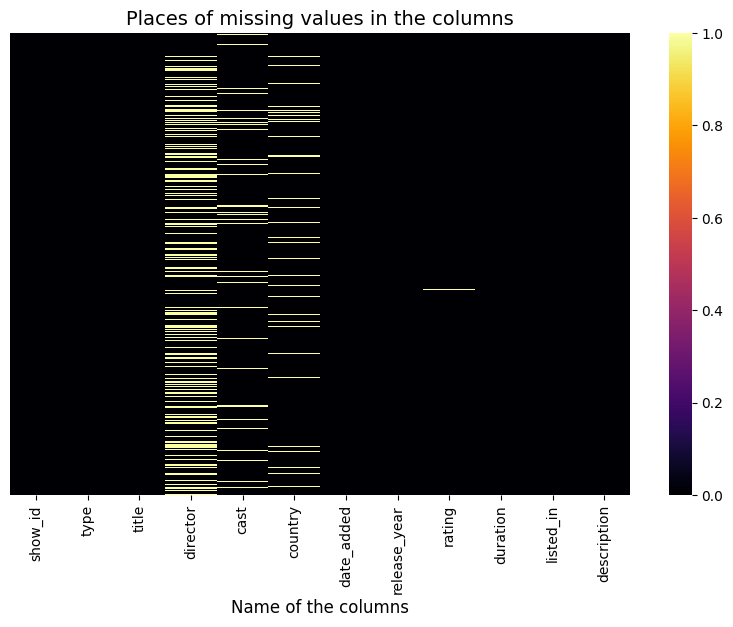

In [ ]:
# Visualizing the missing values

# Creating heatmap for null values
plt.figure(figsize = (10,6))
sns.heatmap(df.isnull(), yticklabels = False, cbar = True, cmap = 'inferno')
plt.xlabel("Name of the columns", fontsize = 12)
plt.title("Places of missing values in the columns", fontsize = 14)

### What did you know about your dataset?

###**Observations About the Dataset**

**1**. The dataset consists of **7787** rows and **12** columns.

**2**. **Four** columns in the dataset have missing values.

**3**. There are a total of **3631** missing values in the table.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns


Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Length of the columns
print(f'There are {len(df.columns)} columns in this netflix movies and tv shows clustering dataset')

There are 12 columns in this netflix movies and tv shows clustering dataset


In [ ]:
# Dataset Describe
df.describe(include='all')

# Transpose of Data Description for better visibility and analysis
df.describe(include='all').T



,count,unique,top,freq,mean,std,min,25%,50%,75%,max
show_id,7787,7787,s1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,7787,2,Movie,5377,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title,7787,7787,3%,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
director,5398,4049,"Raúl Campos, Jan Suter",18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cast,7069,6831,David Attenborough,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN
country,7280,681,United States,2555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date_added,7777,1565,"January 1, 2020",118,NaN,NaN,NaN,NaN,NaN,NaN,NaN
release_year,7787.0,NaN,NaN,NaN,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0
rating,7780,14,TV-MA,2863,NaN,NaN,NaN,NaN,NaN,NaN,NaN
duration,7787,216,1 Season,1608,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Variables Description

**show_id:**  *Unique ID for every Movie / Tv Show.*

**type:**  *Identifier - A Movie or TV Show.*

**title:**  *Title of the Movie / Tv Show.*

**director:**  *Director of the Movie / Show.*

**cast:**  *Actors involved in the Movie / Show.*

**country:**  *Country where the Movie / Show was produced.*

**date_added:**  *Date it was added on Netflix.*

**release_year:**  *Actual release year of the Movie / Show.*

**rating:**  *TV Rating of the Movie / Show.*

**duration:**  *Total Duration - in minutes or number of seasons.*

**listed_in:**  *Genre.*

**description:** *The Summary description.*

### Check Unique Values for each variable

In [ ]:
# Checking Unique Values for each variable
# Iterating over each column in the DataFrame
for col in df.columns:
    # Getting the unique values for the columns
    unique_values = df[col].unique()
    # Printing the column name and its unique values
    print(col, unique_values)

show_id ['s1' 's2' 's3' ... 's7785' 's7786' 's7787']
type ['TV Show' 'Movie']
title ['3%' '7:19' '23:59' ... 'Zulu Man in Japan' "Zumbo's Just Desserts"
 "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"]
director [nan 'Jorge Michel Grau' 'Gilbert Chan' ... 'Josef Fares' 'Mozez Singh'
 'Sam Dunn']
cast ['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'
 'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato'
 'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'
 ...
 'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy'
 'Nasty C' 'Adriano Zumbo, Rachel Khoo']
country ['Brazil' 'Mexico' 'Singapore' 'United States' 'Turkey' 'Egypt' 'India'
 'Poland, United States' 'Thailand' 'Nigeria' nan
 'Norway, Ice

In [ ]:
# Checking the total number of Unique Values for each variable
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

##  ***3. Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready

# Handling the Null Values
df['cast'].fillna(value='No cast',inplace=True)
df['country'].fillna(value=df['country'].mode()[0],inplace=True)
df['director'].fillna(value='NA',inplace=True)

In [ ]:
# 'date_added' and 'rating' contribute only a small portion of the data, we will remove them from the dataset
df.dropna(subset=['date_added','rating'],inplace=True)

In [ ]:
# Checking for the null values after the data wrangling
df.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

### What all manipulations have you done and insights you found?

###**Manipulations:**

**1.** Replaced missing values in the 'cast' column with the placeholder 'No cast'.

**2.** Imputed the missing values in the 'country' column with the most frequently occurring value in the column (the mode).

**3.** Removed rows containing null values in the 'date_added' and 'rating' columns.

**4.** Verified if any null values still exist in the dataset.

**5.** The Null values in Director column were filled with NA.

###**Observations:**

After performing the manipulations on the dataset, some potential findings include:

**1.** The predominant country listed in the 'country' column, after filling the null values, is likely to represent the most common country for Netflix content.

**2.** The significance of the 'cast' column becomes evident as it required filling null values to maintain the dataset's completeness.

**3.** The importance of the 'date_added' and 'rating' columns in the dataset may be questioned, as they were removed due to a limited number of null values. However, this judgment would rely on the specific analysis being conducted.



## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#EDA (Exploratory Data Analysis)

##Chart - 1 | **Type**

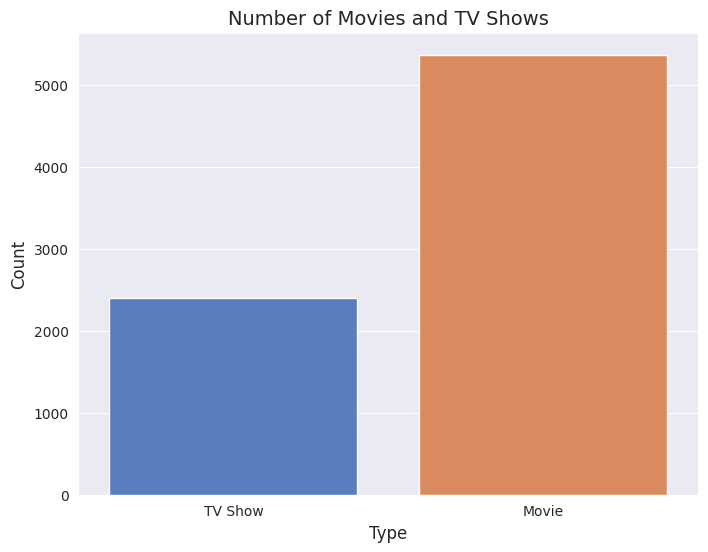

In [ ]:
# Chart - 1 visualization code

# Setting the style
sns.set_style('darkgrid')

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Plotting the count using seaborn's countplot
sns.countplot(x='type', data=df, palette='muted', ax=ax)

# Labeling of values
ax.set_title('Number of Movies and TV Shows', fontsize=14)
ax.set_xlabel('Type', fontsize=12)
ax.set_ylabel('Count', fontsize=12)

# Visualization of number of movies and tv shows
plt.show()


##### 1. Why did you pick the specific chart?

**Using a countplot, a type of bar chart, is an excellent option for visually representing categorical data like the number of movies and TV shows on Netflix. This method effectively illustrates the frequency of each category in a straightforward and easily understandable manner.**

##### 2. What is/are the insight(s) found from the chart?

* Netflix's library comprises **5372** movies and **2398** TV shows, indicating that the number of movies available surpasses the number of TV shows on the platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

While the fact that Netflix has more movies than TV shows may not significantly impact the business alone, it can be valuable when combined with other data to make informed decisions. For instance, if Netflix observes that its subscribers prefer TV shows over movies, it might prioritize acquiring more TV show content. Conversely, if their original movies gain popularity, they may invest more resources in that aspect.

On the negative side, the specific observation about the movie-to-TV show ratio is unlikely to have adverse consequences by itself. However, disregarding subscriber preferences and persistently focusing on movies could lead to potential subscriber losses among those seeking more TV shows. Furthermore, if competitors begin offering more TV shows, Netflix's market share may suffer if it fails to respond by expanding its TV show content.

##Chart - 2 | **Rating**

In [ ]:
# Chart - 2 visualization code

# Displaying the rating column
df['rating']

0       TV-MA
1       TV-MA
2           R
3       PG-13
4       PG-13
        ...  
7782    TV-MA
7783    TV-14
7784    TV-MA
7785    TV-PG
7786    TV-MA
Name: rating, Length: 7770, dtype: object

In [ ]:
# Creating a new column target_ages
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}

df['target_ages'] = df['rating'].map(ratings)

In [ ]:
# Converting 'type' column to categorical data type
df['type'] = pd.Categorical(df['type'])

# Creating a new categorical column 'target_ages' with specified categories
df['target_ages'] = pd.Categorical(df['target_ages'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])


In [ ]:
# Displaying the updated dataframe
df

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens
...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults
7783,s7784,Movie,Zubaan,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens
7784,s7785,Movie,Zulu Man in Japan,Nasty C,United States,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults
7785,s7786,TV Show,Zumbo's Just Desserts,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids


In [ ]:
# Creating two extra columns
tv_shows=df[df['type']=='TV Show']
movies=df[df['type']=='Movie']

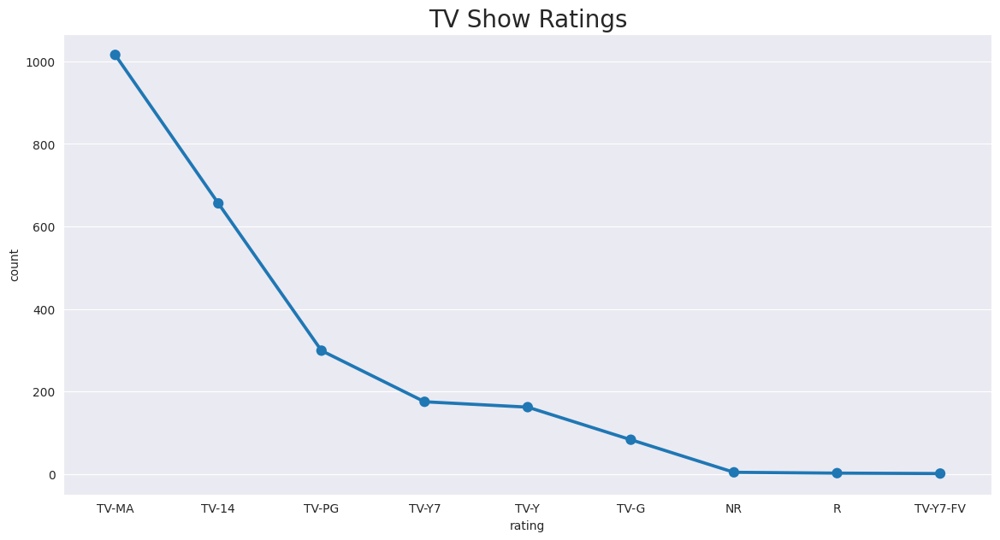

In [ ]:
# Grouping TV shows by 'rating' and counting the number of shows in each rating category
tv_ratings = tv_shows.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)

# Setting figure dimensions
fig_dims = (14,7)

# Creating a figure and axis object with specified dimensions
fig, ax = plt.subplots(figsize=fig_dims)

# Creating a point plot using Seaborn's pointplot() function, with 'rating' on the x-axis and 'count' on the y-axis
sns.pointplot(x='rating',y='count',data=tv_ratings)

# Setting the plot title and font size
plt.title('TV Show Ratings',size='20')

# Displaying the plot
plt.show()


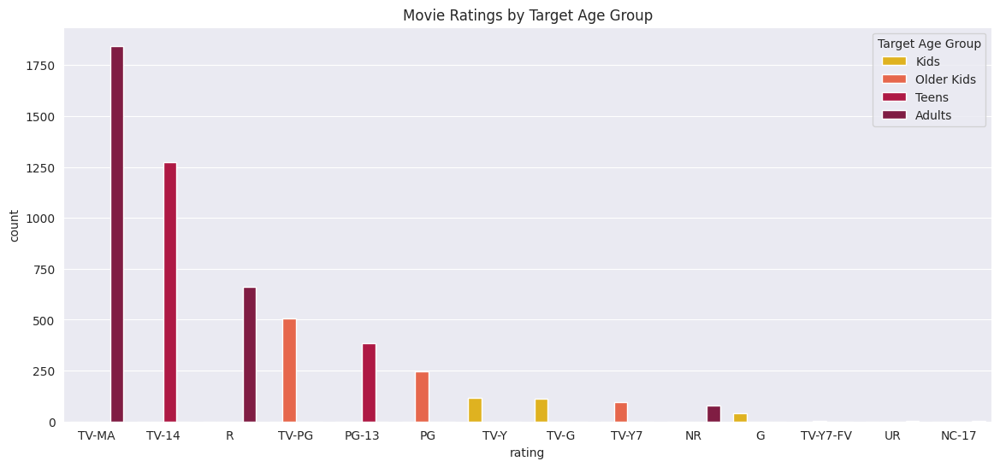

In [ ]:
# Creating a color palette for the different target age groups
colors = ["#FFC300", "#FF5733", "#C70039", "#900C3F"]

# Plotting a countplot to show the movie ratings based on target age groups
plt.figure(figsize=(14,6))
plt.title('Movie Ratings by Target Age Group')

sns.countplot(x=movies['rating'], hue=movies['target_ages'], data=movies,
              order=movies['rating'].value_counts().index, palette=colors)

# Adding a legend to the plot
plt.legend(title='Target Age Group', loc='upper right', labels=['Kids', 'Older Kids', 'Teens', 'Adults'])

# Visualization of the chart
plt.show()


##### 1. Why did you pick the specific chart?

**The reason for selecting this chart is its ability to present the distribution of TV show ratings in a clear and succinct manner. The bars facilitate straightforward comparisons between various ratings, and the descending order by count accentuates the prevalence of TV-MA. As a result, this chart offers a swift and informative snapshot of the ratings landscape for TV shows on Netflix.**





.

##### 2. What is/are the insight(s) found from the chart?

* Based on the dataset, TV-MA emerges as the most prevalent rating for both TV shows and movies on Netflix. This indicates a substantial portion of the platform's content is targeted towards adult audiences. The abundance of TV-MA ratings implies that Netflix's content predominantly caters to a mature demographic, featuring themes that may be intended for more mature viewers and potentially addressing controversial subjects.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained from the prevalence of TV-MA ratings can positively influence Netflix's business strategy. By recognizing the popularity of adult-oriented content, Netflix can continue to prioritize the production and acquisition of material that appeals to mature audiences. This strategy can help attract and retain subscribers interested in such themes while allowing the company to tailor its marketing efforts to specific age groups associated with different ratings.

However, there is a potential downside to consider. Some subscribers might be dissuaded by the abundance of mature content, especially those seeking family-friendly programming. Consequently, there is a risk of losing subscribers who are not comfortable with adult themes. To maintain a balanced approach and prevent alienating specific demographics, Netflix should carefully curate its content offerings to cater to a wide range of viewers.

##Chart - 3 | **Release Year**

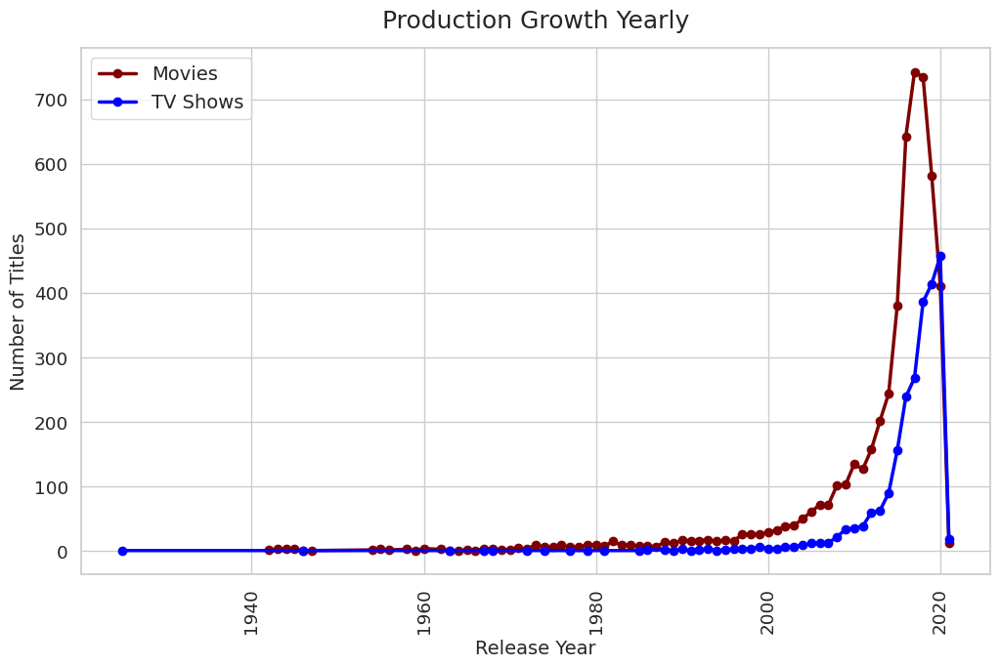

In [ ]:
# Chart - 3 visualization code

# Extracting the count of movies and TV shows for each year
movies_year = movies['release_year'].value_counts().sort_index(ascending=False)
tvshows_year = tv_shows['release_year'].value_counts().sort_index(ascending=False)

# Setting the style
sns.set(style='whitegrid', font_scale=1.2)

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(12, 7))

# Plotting the data using the axis object
ax.plot(movies_year.index, movies_year.values, color='maroon', label='Movies', linewidth=2.5, marker='o')
ax.plot(tvshows_year.index, tvshows_year.values, color='blue', label='TV Shows', linewidth=2.5, marker='o')

# Customizing the plot
plt.xticks(rotation=90)
ax.set_xlabel('Release Year', fontsize=14)
ax.set_ylabel('Number of Titles', fontsize=14)
ax.set_title('Production Growth Yearly', fontsize=18, pad=15)
ax.legend(fontsize=14)

# Showing the plot
plt.show()


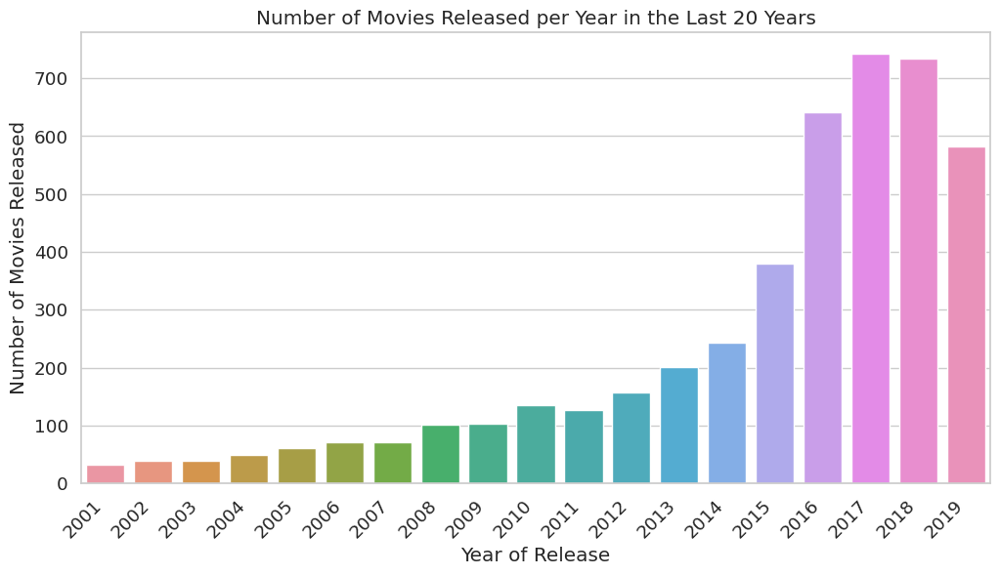

In [ ]:
# Extracting the last 20 years from the dataset
last_20_years = range(2001, 2020)

# Filtering the dataset to only include movies from the last 20 years
movies_last_20_years = movies[movies['release_year'].isin(last_20_years)]

# Setting the style
sns.set_palette('mako')

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Creating a count plot using the axis object
sns.countplot(x='release_year', data=movies_last_20_years, order=last_20_years, ax=ax)

# Customizing the plot
plt.xticks(rotation=45, ha='right')
ax.set_xlabel('Year of Release')
ax.set_ylabel('Number of Movies Released')
ax.set_title('Number of Movies Released per Year in the Last 20 Years')

# Showing the plot
plt.show()


In [ ]:
# Displaying the tvshows_year column
tvshows_year

2021     19
2020    457
2019    414
2018    386
2017    268
2016    239
2015    156
2014     90
2013     63
2012     60
2011     39
2010     36
2009     34
2008     22
2007     13
2006     13
2005     12
2004      9
2003      7
2002      6
2001      4
2000      4
1999      7
1998      4
1997      4
1996      3
1995      2
1994      1
1993      4
1992      2
1991      1
1990      3
1989      1
1988      2
1986      2
1985      1
1981      1
1979      1
1977      1
1974      1
1972      1
1968      1
1967      1
1963      1
1946      1
1925      1
Name: release_year, dtype: int64

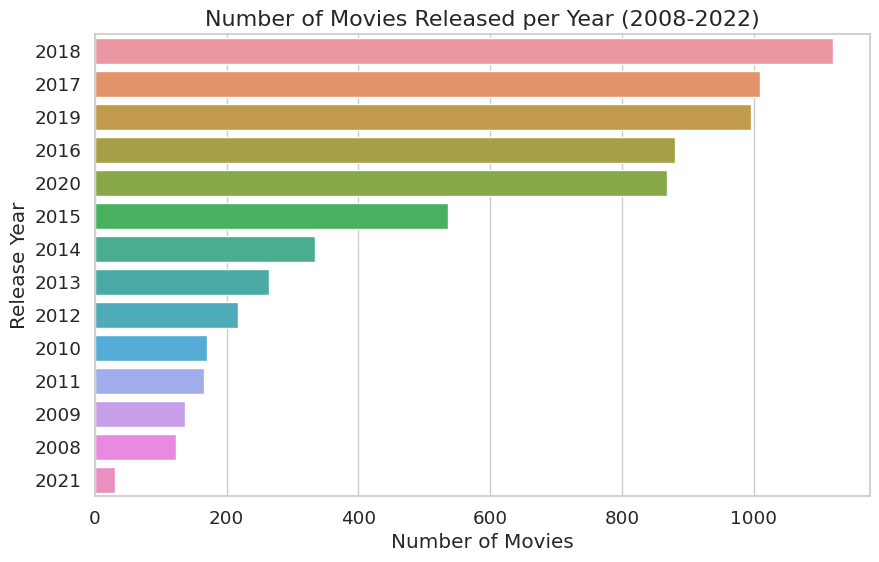

In [ ]:
# Filtering for movies released in the last 15 years
movies_last_15_years = df[df['release_year'] >= 2008]

# Setting the style
sns.set_palette('pastel')

# Creating a new figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Creating a count plot using the axis object with horizontal bars
sns.countplot(y='release_year', data=movies_last_15_years, order=movies_last_15_years['release_year'].value_counts().index[:15], ax=ax)

# Customizing the plot
ax.set_title('Number of Movies Released per Year (2008-2022)', fontsize=16)
ax.set_xlabel('Number of Movies')
ax.set_ylabel('Release Year')

# Showing the plot
plt.show()


In [ ]:
# Displaying the updated dataframe
df

,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens
...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults
7783,s7784,Movie,Zubaan,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens
7784,s7785,Movie,Zulu Man in Japan,Nasty C,United States,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults
7785,s7786,TV Show,Zumbo's Just Desserts,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids


In [ ]:
# Adding columns of month of addition

df['month'] = pd.DatetimeIndex(df['date_added']).month
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages,month
0,s1,TV Show,3%,NA,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1


##### 1. Why did you pick the specific chart?

**The most suitable charts for displaying the number of movies and TV shows released per year from 2015 to 2020 would be a line chart or a bar chart. These charts allow for easy comparison between the two categories and help identify trends or patterns in the data. Another option could be a stacked bar chart or a stacked area chart, which can show the proportion of movies and TV shows released in each year.**

**The reason for choosing these specific charts is that they effectively convey the message that the number of movies released on Netflix has been increasing at a faster rate than the number of TV shows. Moreover, the charts highlight the trend of increased production of both movies and TV shows after 2015, followed by a decline after 2020. Overall, these visualizations are instrumental in illustrating the growth and changes in Netflix's content over the specified years.**

##### 2. What is/are the insight(s) found from the chart?

**1.** The years 2017 and 2018 saw the highest number of movie releases, while 2020 had the highest number of TV show releases.

**2.** Movie releases on Netflix have grown at a significantly faster rate than TV show releases.

**3.** Since 2015, there has been a substantial increase in the quantity of movies and TV show episodes available on Netflix.

**4.** However, after 2020, there has been a noticeable decline in the number of movies and TV show episodes produced.

**5.** It seems that Netflix has prioritized expanding its movie content over TV shows, given the much higher growth rate of movies compared to TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights derived from the analysis could positively impact Netflix's business strategy. The data indicates that focusing on increasing movie content could be a successful approach, attracting and retaining more viewers. However, the sharp decline in content production after 2020 may raise concerns for the company, suggesting possible challenges in production or insufficient investment in content creation. If this trend persists, negative growth could occur, prompting viewers to seek other streaming services with a broader content selection.

In conclusion, while the analysis offers potential opportunities for Netflix, continuous monitoring of trends and adaptability to market changes are essential to ensure sustained growth and success.

##Chart - 4 | **Release Month**

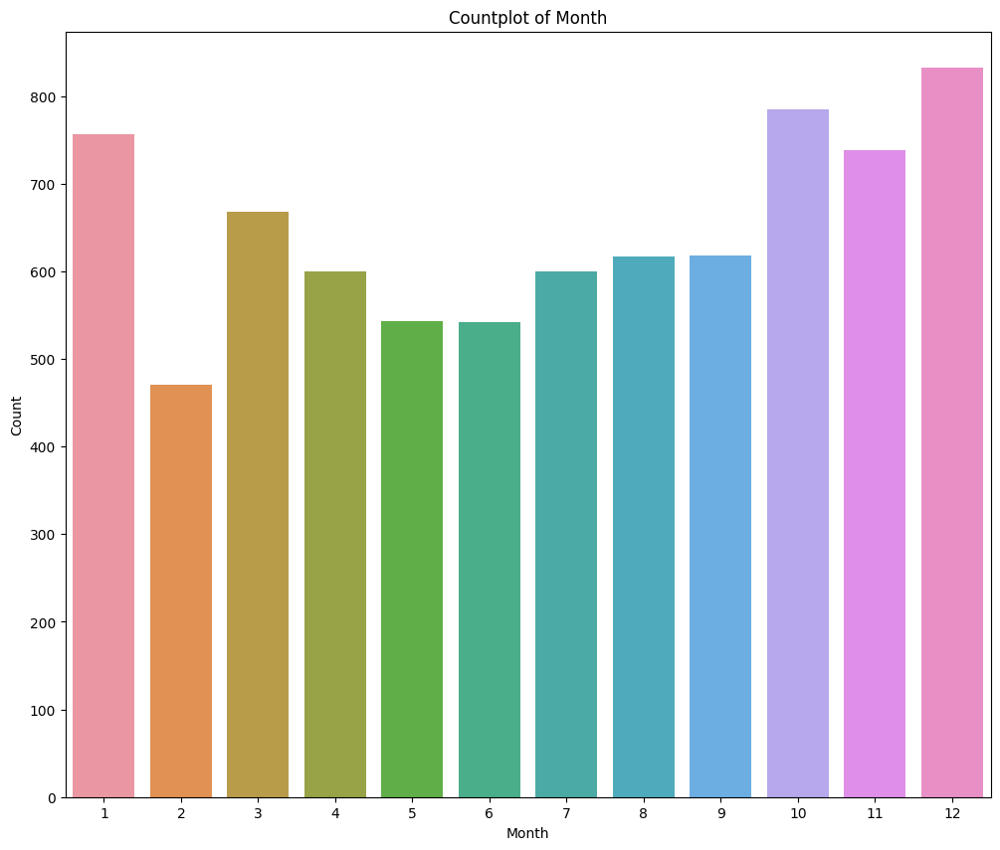

In [ ]:
# Chart - 4 visualization code

# Displaying the Distribution of Movie Releases by Month
plt.figure(figsize=(12, 10))
sns.set_palette('deep')
sns.countplot(x='month', data=df)
plt.title('Countplot of Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()


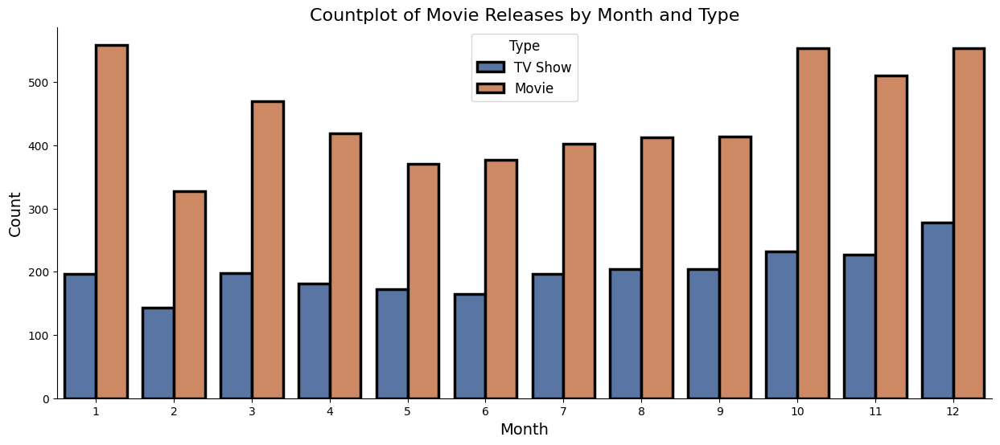

In [ ]:
# Visualization of Movie Releases by Month and Type
fig, ax = plt.subplots(figsize=(15, 6))
sns.set_palette('deep')

sns.countplot(x='month', hue='type', data=df, edgecolor='black', linewidth=2.5, ax=ax)
ax.set_title('Countplot of Movie Releases by Month and Type', fontsize=16)
ax.set_xlabel('Month', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

legend_labels = df['type'].unique()
ax.legend(labels=legend_labels, fontsize=12, title='Type', title_fontsize=12)

sns.despine()
plt.show()


##### 1. Why did you pick the specific chart?

**The chosen chart, a countplot with hue, is highly effective for visualizing and comparing the number of movies and TV shows added to Netflix each month. By using the hue parameter, we can clearly observe the individual contributions of movies and TV shows to the overall count for each month. This allows us to easily spot any patterns or trends in the data.**

**Notably, the countplot reveals a significant surge in the addition of both movies and TV shows to Netflix from October to January. This information holds crucial importance for Netflix and content creators, as it indicates a period when audience interest in new content is likely to be at its peak. As a result, this time frame could be strategically advantageous for releasing new content to potentially maximize viewership and overall success.**

##### 2. What is/are the insight(s) found from the chart?

* Based on the countplot, it is evident that Netflix experiences its peak in adding movies and TV shows during the months spanning from October to January. This timeframe appears to be the most active and bustling period for Netflix in terms of introducing fresh content to its platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**1.** Understanding that the majority of content is added to Netflix between October and January can potentially yield positive business outcomes. This information enables Netflix to strategize their content acquisition and release schedule effectively, maximizing user engagement during these months. For instance, they could focus on acquiring and releasing more popular titles during this period to attract and retain users.

**2.** Nevertheless, it is crucial to acknowledge that relying solely on the countplot may not be enough to achieve a significant positive impact. To create a comprehensive content acquisition and release strategy, Netflix must analyze user viewing patterns, preferences, and closely monitor competition and market trends.

**3.** In terms of negative growth, the countplot itself does not provide specific insights that lead to negative growth. However, if Netflix were to solely depend on this plot and overlook critical factors like user preferences, shifting market trends, and competitive landscape, it could potentially lead to negative growth due to an inadequate content selection and acquisition strategy.

##Chart - 5 | **Genre**

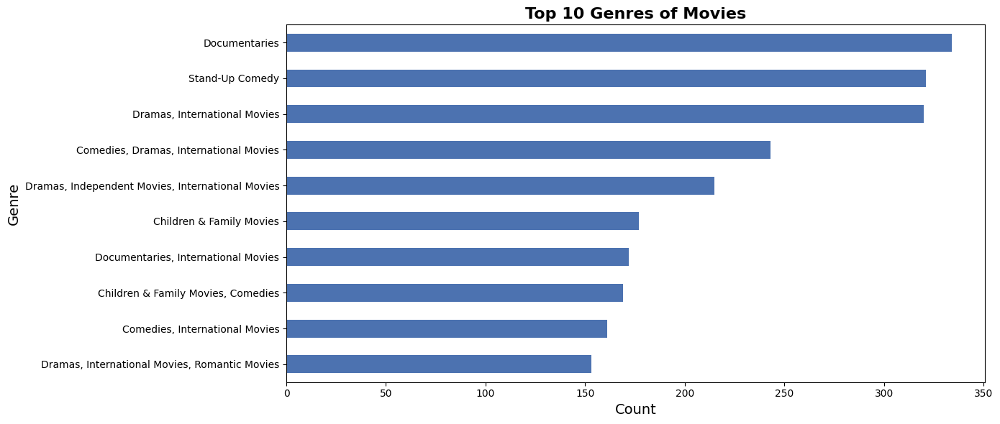

In [ ]:
# Chart - 5 visualization code

# Getting the top 10 genres
top10_genres = movies['listed_in'].value_counts().nlargest(10)

# Visualization of the top 10 genres
plt.figure(figsize=(14, 6))
top10_genres.plot(kind='barh')
plt.title('Top 10 Genres of Movies', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=14)
plt.ylabel('Genre', fontsize=14)
plt.gca().invert_yaxis()  # Inverting the y-axis to display genres from top to bottom
plt.tight_layout()
plt.show()

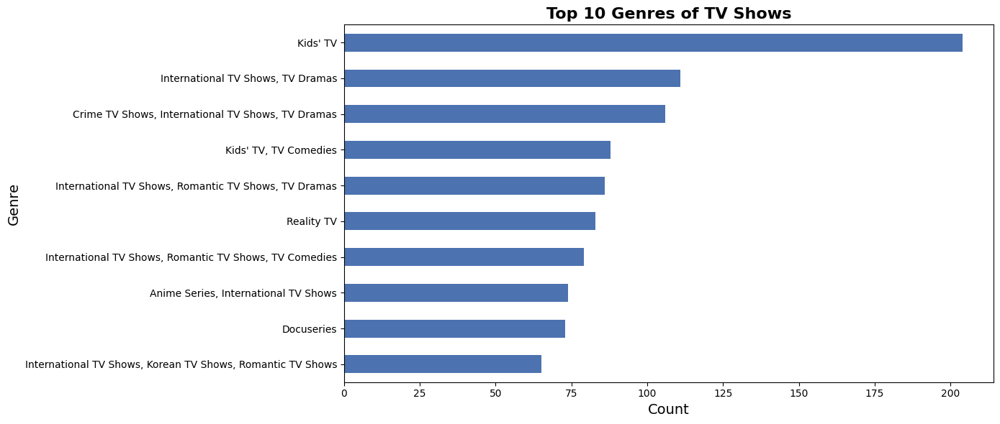

In [ ]:
# Getting the top 10 genres
top10_genres_tvshows = tv_shows['listed_in'].value_counts().nlargest(10)

# Visualization of the top 10 genres
plt.figure(figsize=(14, 6))
top10_genres_tvshows.plot(kind='barh')
plt.title('Top 10 Genres of TV Shows', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=14)
plt.ylabel('Genre', fontsize=14)
plt.gca().invert_yaxis()  # Inverting the y-axis to display genres from top to bottom
plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

**To obtain the number of Netflix shows and TV shows, we can analyze the dataset to determine the count of each category.**

##### 2. What is/are the insight(s) found from the chart?

* Netflix offers a wide variety of TV show genres, but one genre that consistently captures the hearts of viewers of all ages is **kids TV**. The kids TV category on Netflix presents a diverse collection of animated and live-action shows, catering to families seeking enjoyable and educational content. Classic favorites like SpongeBob SquarePants and Power Rangers coexist with fresh and captivating series such as Carmen Sandiego and The Dragon Prince, ensuring there's something for every young viewer.

* What sets Netflix's kids TV category apart is its commitment to providing a safe and secure viewing environment for children. Parents can utilize features like parental controls to set age-appropriate filters, monitor viewing history, and restrict access to specific shows or movies, ensuring a worry-free entertainment experience for the whole family.

* Whether you need entertaining options for a rainy day or seek a way to connect with your loved ones through shared TV experiences, Netflix's kids TV category offers an extensive selection of entertaining and enriching content, making it a popular choice among users.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**1.** The most popular genre among TV shows on Netflix is kids TV, featuring a mix of educational and entertaining content suitable for children of all ages. This category includes well-known series like "Paw Patrol," "Peppa Pig," "The Magic School Bus," and "Stranger Things."

**2.** The valuable insights derived from this information can have a positive impact on Netflix's business. With a clear understanding of their audience's preferences, Netflix can customize their content offerings and marketing strategies to better resonate with their target viewers. For instance, they might allocate more resources to producing high-quality kids shows and actively promote them to parents with young kids.

**3.** However, this trend could also present some challenges for growth. If Netflix excessively prioritizes kids TV shows at the expense of other genres, they may risk alienating older viewers who seek more mature content. Additionally, any decline in the quality of their kids programming or the loss of rights to popular shows could potentially harm their business. Striking a balance between catering to their core audience and offering a diverse range of content is crucial for sustaining broader appeal.

**Overall, understanding the popularity of kids TV on Netflix provides both opportunities and potential risks that the company must navigate to maintain their position as a leading streaming platform.**

##Chart - 6 | **Duration**

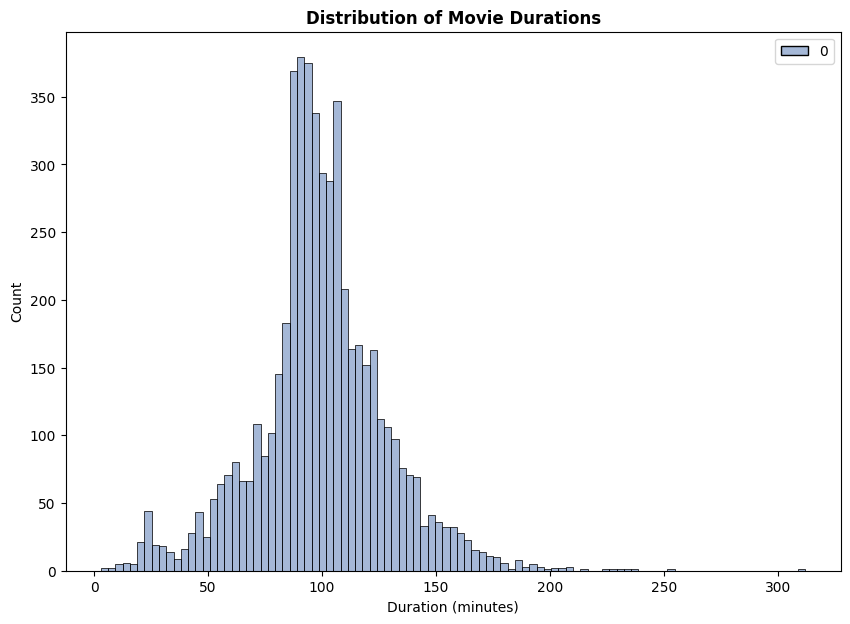

In [ ]:
# Chart - 6 visualization code

# Creating a figure and setting it's size
plt.figure(figsize=(10, 7))

# Extracting the duration values as integers using regex and plotting a histogram
sns.histplot(movies['duration'].str.extract('(\d+)').astype(int), kde=False, color='red')

# Setting the title of the plot
plt.title('Distribution of Movie Durations', fontweight='bold')

# Setting the x-axis label
plt.xlabel('Duration (minutes)')

# Setting the y-axis label
plt.ylabel('Count')

# Showing the plot
plt.show()

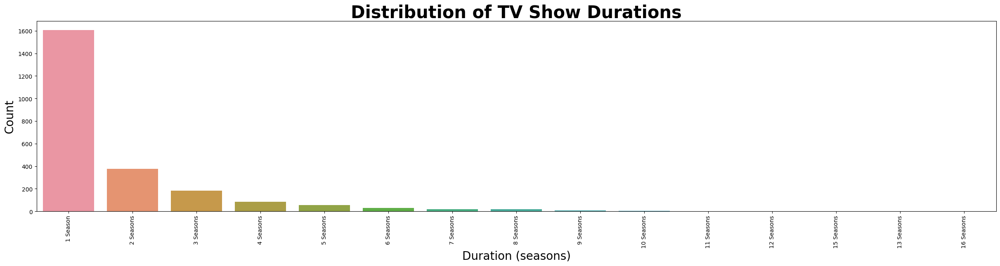

In [ ]:
# Setting the figure size
plt.figure(figsize=(30, 6))

# Creating a count plot of TV Show durations
sns.countplot(x=tv_shows['duration'], data=tv_shows, order=tv_shows['duration'].value_counts().index)

# Setting the title of the plot
plt.title("Distribution of TV Show Durations", fontweight='bold',size='30')

# Setting the x-axis label
plt.xlabel("Duration (seasons)",size='20')

# Setting the y-axis label
plt.ylabel("Count",size='20')

# Rotating the x-axis labels
plt.xticks(rotation=90)

# Showing the plot
plt.show()

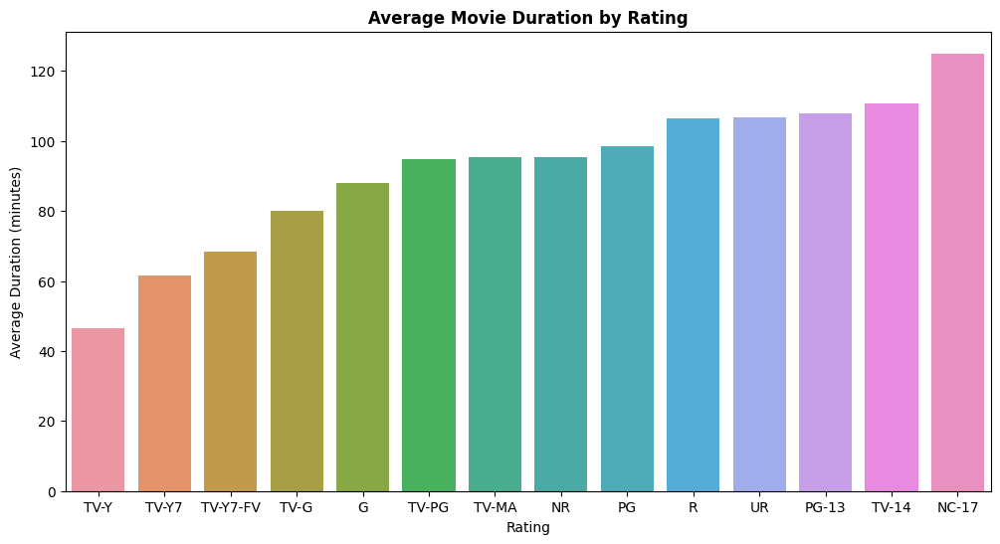

In [ ]:
# Extracting the duration values as integers using regex
movies['minute'] = movies['duration'].str.extract('(\d+)').apply(pd.to_numeric)

# Calculating the average movie duration by rating
duration_year = movies.groupby(['rating'])['minute'].mean()

# Creating a DataFrame to store the results and sort by average duration
duration_df = pd.DataFrame(duration_year).sort_values('minute')

# Setting the figure size
plt.figure(figsize=(12, 6))

# Creating a bar plot of the average movie duration by rating
ax = sns.barplot(x=duration_df.index, y=duration_df.minute)

# Setting the title of the plot
plt.title("Average Movie Duration by Rating", fontweight='bold')

# Setting the x-axis label
plt.xlabel("Rating")

# Setting the y-axis label
plt.ylabel("Average Duration (minutes)")

# Showing the plot
plt.show()

##### 1. Why did you pick the specific chart?

**The correlation between movie duration and rating plays a significant role in influencing a viewer's movie-watching decision. Visualizing this relationship through a chart helps to identify patterns and trends that can be insightful for various stakeholders. For instance, the chart's findings indicate that NC-17 movies generally have longer runtimes compared to other ratings, which could be beneficial information for filmmakers and movie studios.**

**Likewise, the chart highlights that TV-Y rated movies tend to be shorter, making it valuable for parents seeking age-appropriate content for their children. Such a chart serves as a valuable resource for filmmakers, studios, distributors, and viewers, offering useful insights into the movie industry's dynamics and aiding in making informed decisions.**

##### 2. What is/are the insight(s) found from the chart?

* Upon analyzing movie durations, it was evident that a significant portion of movies falls within the **50 to 150-minute range**. Conversely, for TV shows, there is a notable prevalence of single-season shows, indicating a predominance of relatively new content in the TV category on Netflix.

* The analysis also highlighted that movies with an **NC-17** rating exhibit the longest average duration. This observation can be attributed to the fact that movies with this rating often delve into mature themes and explicit content, necessitating a longer runtime to effectively portray the story.

* Conversely, movies with a **TV-Y** rating, suitable for all children, have the shortest average runtime. This suggests that movies with this rating are typically shorter and may revolve around simpler plots and themes that cater to younger audiences.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**1.** The insights gained from the analysis hold the potential to create a positive business impact, empowering movie studios and streaming platforms to gain a deeper understanding of their audience's preferences. This understanding enables them to tailor their content offerings to meet the specific needs and interests of their viewers. For example, noticing that NC-17 rated movies tend to have longer runtimes may lead to increased investment in creating mature content for adult audiences. Similarly, recognizing that TV-Y rated movies have shorter runtimes may drive the focus towards producing engaging, family-friendly content for younger viewers.

**2.** However, there is also the possibility of negative growth stemming from certain insights. For instance, if studios and platforms observe that most TV shows only consist of a single season, they may become reluctant to invest in additional seasons for a show, even if it has a dedicated fanbase. This decision could lead to limited growth in terms of audience and revenue for particular shows or franchises. Additionally, if they discover that movies with certain ratings consistently perform poorly in terms of ratings or box office revenue, they might avoid investing in similar projects in the future. This cautious approach may, in turn, reduce the variety of content available to audiences.

**In conclusion, it is crucial for businesses to carefully evaluate all the insights obtained from their analysis. They should consider both the positive and negative impacts that the data may have on their growth trajectory. Thoughtful consideration of these insights will aid in making informed decisions that align with their business goals and cater to their audience's preferences effectively.**

##Chart - 7 | **Country**

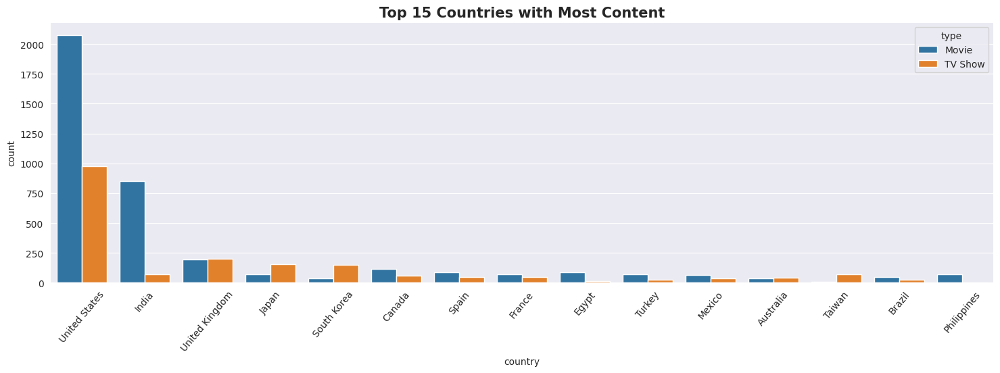

In [ ]:
# Chart - 7 visualization code

# Set the figure size to 18x5
plt.figure(figsize=(18, 5))

# Create a countplot for the 'country' column
# Order the bars in descending order by their value counts
# Limit the plot to show only the top 15 countries
# Use different colors for 'TV Show' and 'Movie' categories
sns.countplot(x=df['country'], order=df['country'].value_counts().index[0:15], hue=df['type'])

# Rotate the x-axis tick labels by 50 degrees for better visibility
plt.xticks(rotation=50)

# Set the plot title with larger font size and bold text
plt.title('Top 15 Countries with Most Content', fontsize=15, fontweight='bold')

# Display the plot
plt.show()


In [ ]:
# Count the occurrences of each country in the 'country' column and reset the index
# This will give us a DataFrame with two columns: 'country' containing country names and 'count' containing the counts
country_counts = df['country'].value_counts().reset_index()

# Rename the columns to provide more clarity
country_counts.columns = ['Country', 'Count']

# Display the DataFrame showing the count of contents in each country
country_counts



,Country,Count
0,United States,3051
1,India,923
2,United Kingdom,396
3,Japan,224
4,South Korea,183
...,...,...
676,"Russia, United States, China",1
677,"Italy, Switzerland, France, Germany",1
678,"United States, United Kingdom, Canada",1
679,"United States, United Kingdom, Japan",1


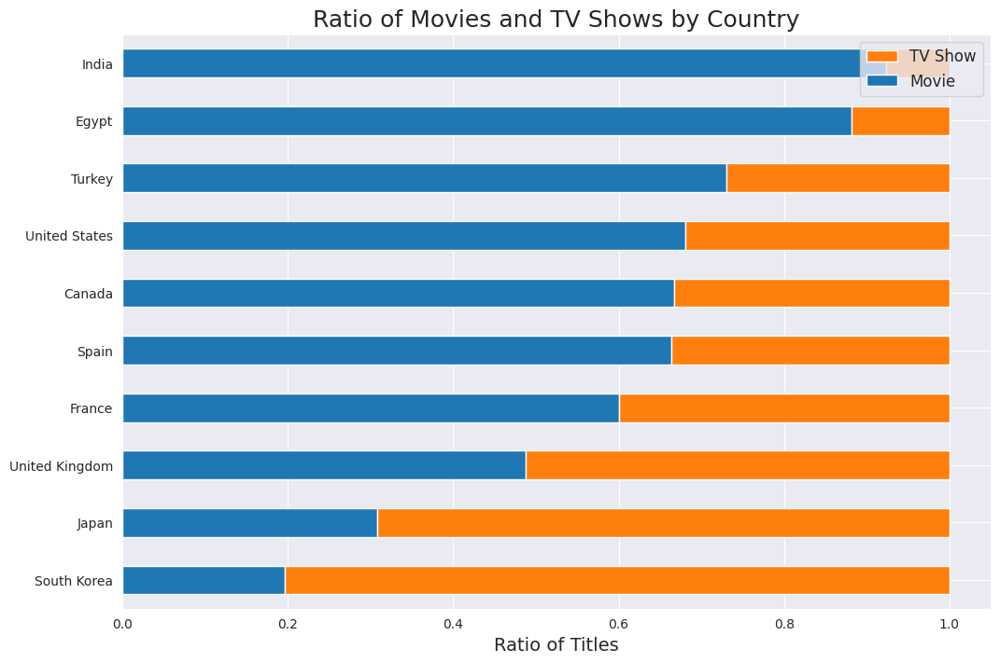

In [ ]:
# Get the top 10 countries by count of titles and store them in 'country_order'
country_order = df['country'].value_counts()[:10].index

# Create a new DataFrame 'content_data' with count of movies and TV shows for each country in 'country_order'
content_data = df[['type', 'country']].groupby('country')['type'].value_counts().unstack().loc[country_order]

# Add a new column 'total' to 'content_data' representing the total count of titles for each country
content_data['total'] = content_data.sum(axis=1)

# Calculate the ratio of movies and TV shows for each country and store it in 'content_data_ratio'
content_data_ratio = (content_data.T / content_data['total']).T[['Movie', 'TV Show']]

# Create a horizontal bar chart to visualize the data, with stacked bars representing the movie and TV show ratio
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
content_data_ratio.sort_values(by='Movie').plot(kind='barh', stacked=True, ax=ax)

# Set the x-axis label and plot title
ax.set_xlabel('Ratio of Titles', fontsize=14)
ax.set_title('Ratio of Movies and TV Shows by Country', fontsize=18)

# Set the legend for the plot
# Reversed order of handles and labels to match the bar colors with the legend correctly
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), fontsize=12, loc='upper right')


In [ ]:
# Add a new column 'count' to the DataFrame to indicate the presence of each title (set to 1)
df['count'] = 1

# Group the DataFrame by 'country', calculate the sum of 'count' for each country,
# then sort the data in descending order based on the total count
# and store the top 10 countries with the highest counts in 'data' DataFrame
data = df.groupby('country')['count'].sum().sort_values(ascending=False).reset_index()[:10]
top_countries = data['country']  # Extract the names of the top 10 countries

# Create a new DataFrame 'df_heatmap' containing data only for the top 10 countries
df_heatmap = df[df['country'].isin(top_countries)]

# Create a pivot table using 'pd.crosstab' to calculate the relative frequency of content target ages
# for each country and normalize it by index (rows sum up to 1)
df_heatmap = pd.crosstab(df_heatmap['target_ages'], df_heatmap['country'], normalize="index")

# Transpose the pivot table to switch rows and columns, making it suitable for a heatmap
df_heatmap = df_heatmap.T

# Display the resulting DataFrame 'df_heatmap' ready for the heatmap
df_heatmap


target_ages,Kids,Older Kids,Teens,Adults
country,,,,
Canada,0.084211,0.041152,0.015941,0.032631
Egypt,0.000000,0.004115,0.042305,0.011565
France,0.028947,0.007202,0.011649,0.032218
India,0.039474,0.152263,0.321275,0.097480
Japan,0.005263,0.062757,0.048437,0.033870
Mexico,0.005263,0.007202,0.008584,0.031805
South Korea,0.013158,0.022634,0.042918,0.035523
Spain,0.007895,0.006173,0.007971,0.046262
United Kingdom,0.097368,0.083333,0.045984,0.083850


##### 1. Why did you pick the specific chart?

**Based on the provided data, it is evident that Netflix has the most extensive content library in the United States, closely followed by India. Furthermore, India stands out as the country with the highest number of movies available on the platform.**

**To effectively convey this information visually, a bar chart or a horizontal bar chart would be suitable choices. A bar chart can display the title count for each country side by side, facilitating easy comparison. Alternatively, a horizontal bar chart can also be effective, especially if we wish to present the countries in descending order of title count.**

##### 2. What is/are the insight(s) found from the chart?

* The United States leads with the highest content count on Netflix, with India following closely behind. Additionally, India boasts the highest number of movies available on the platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**1.** Our analysis indicates that the United States leads with the highest number of content on Netflix, with India ranking second in terms of content volume.

**2.** Interestingly, India stands out with the highest count of movies available on the Netflix platform.

**3.** These findings offer valuable insights for Netflix to optimize their content recommendations for users based on their geographic locations.

**4.** Additionally, this information can aid Netflix in strategizing their content production efforts, focusing on content types that resonate well with specific countries.

**5.** However, it's crucial to consider potential drawbacks. Overemphasizing content production for certain regions may lead to neglecting other markets, impacting viewership and revenue.

**6.** Moreover, if Netflix heavily favors producing one content type, they might miss out on opportunities to attract viewers who prefer other content genres, potentially limiting their audience reach.

**In conclusion, while the analysis provides valuable insights to guide Netflix's decisions, it is essential to approach these insights with a balanced perspective, acknowledging both positive and negative impacts.**

##Chart - 8 | **Originals**

In [ ]:
# Chart - 8 visualization code

# Convert the 'date_added' column in the DataFrame 'df' to datetime format
# This allows us to work with the date as a datetime object, enabling various date-based operations
df['date_added'] = pd.to_datetime(df['date_added'])

# Extract the year from the 'date_added' column and create a new column 'year_added' in the DataFrame 'df'
# This column will hold the year information for each title's date of addition on Netflix
movies['year_added'] = df['date_added'].dt.year

# Display the updated DataFrame 'df' with the converted 'date_added' column and the new 'year_added' column
df


,show_id,type,title,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages,month,count
0,s1,TV Show,3%,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8,1
1,s2,Movie,7:19,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12,1
2,s3,Movie,23:59,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12,1
3,s4,Movie,9,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11,1
4,s5,Movie,21,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...",2020-10-19,2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,Adults,10,1
7783,s7784,Movie,Zubaan,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,2019-03-02,2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,Teens,3,1
7784,s7785,Movie,Zulu Man in Japan,Nasty C,United States,2020-09-25,2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",Adults,9,1
7785,s7786,TV Show,Zumbo's Just Desserts,"Adriano Zumbo, Rachel Khoo",Australia,2020-10-31,2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,Older Kids,10,1


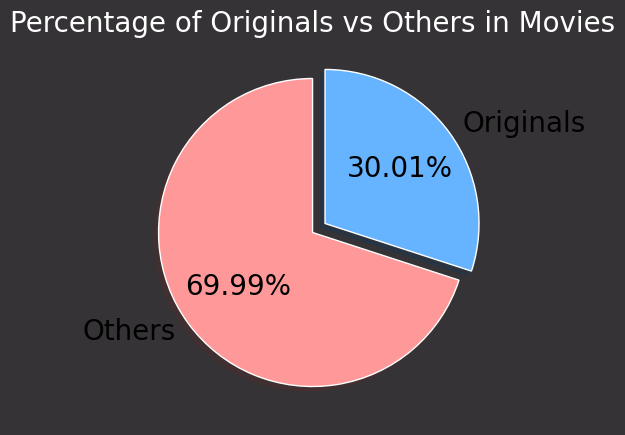

In [ ]:
# Create a new column 'originals' in the 'movies' DataFrame to indicate if a movie is an original or not
# If the 'release_year' and 'year_added' values are the same, it means the movie is an original, otherwise, it's not
movies['originals'] = np.where(movies['release_year'] == movies['year_added'], 'Yes', 'No')

# Create a pie chart to visualize the percentage of original movies and non-original movies in the dataset
fig, ax = plt.subplots(figsize=(5, 5), facecolor="#363336")
ax.patch.set_facecolor('#363336')

# Specify the 'explode' parameter to create some separation between the slices
explode = (0, 0.1)

# Count the number of movies in each category (originals and others) using 'value_counts()'
# Plot a pie chart with labels, percentages, and shadows using the 'ax.pie()' method
# Change the colors of the pie chart slices to more attractive colors
ax.pie(movies['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels=['Others', 'Originals'],
       shadow=True, startangle=90, textprops={'color': "black", 'fontsize': 20},
       colors=['#ff9999', '#66b3ff'])

# Set the title for the plot
ax.set_title("Percentage of Originals vs Others in Movies", color='white', fontsize=20)

# Display the pie chart
plt.show()


##### 1. Why did you pick the specific chart?

**The pie chart was used in the provided code to visually represent the percentage distribution of original movies and non-original movies in the dataset. Pie charts are commonly used to display how a single whole (100%) is divided into various parts, showing the proportion of each part relative to the whole.**

##### 2. What is/are the insight(s) found from the chart?

* Despite Netflix's reputation for producing original content, it is intriguing to discover that only 30% of the movies on the platform are actual Netflix productions. The majority, around 70%, consists of movies that were acquired from various sources, including theaters and other streaming platforms.

* This statistic emphasizes the vast collection of films that Netflix has amassed over time, offering viewers a diverse array of content from different parts of the world. From classic Hollywood movies to foreign cinema, Netflix caters to a wide range of interests and preferences.

* As you navigate through Netflix's extensive movie library, it's essential to remember that only a small fraction of it constitutes original content. The majority of the movies available have been procured and added to the platform, providing viewers with an abundance of entertainment choices.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**1.** Looking at the positive aspect, the fact that 70% of movies added to Netflix were previously released through other modes showcases Netflix's ability to acquire popular content that has already proven successful. This strength enables Netflix to offer a diverse selection of content to its customers without bearing the high expenses of producing original content.

**2.** Furthermore, the presence of 30% of movies that are Netflix's own original productions highlights their investment in creating exclusive content. This strategic move allows Netflix to stand out from competitors and create distinctive material that attracts new viewers while retaining existing ones.

**However, considering the negative side, if Netflix struggles to produce original content as appealing as the acquired content, it might experience a decline in its subscriber base. Additionally, relying too heavily on acquired content could lead to challenges in negotiating favorable licensing agreements with content providers, potentially resulting in increased costs and reduced profitability.**

##Chart - 9 | **Correlation Heatmap**

In [ ]:
# Correlation Heatmap visualization code

# Create a new column 'count' in the DataFrame to indicate the presence of each title (set to 1)
df['count'] = 1

# Group the DataFrame by 'country', calculate the sum of 'count' for each country,
# then sort the data in descending order based on the total count
# and store the top 10 countries with the highest counts in 'data' DataFrame
data = df.groupby('country')['count'].sum().sort_values(ascending=False).reset_index()[:10]
top_countries = data['country']  # Extract the names of the top 10 countries

# Create the DataFrame 'df_heatmap' containing data only for the top 10 countries
df_heatmap = df[df['country'].isin(top_countries)]

# Create a pivot table using 'pd.crosstab' to calculate the relative frequency of content target ages
# for each country and normalize it by index (rows sum up to 1)
df_heatmap = pd.crosstab(df_heatmap['target_ages'], df_heatmap['country'], normalize="index")

# Transpose the pivot table to switch rows and columns, making it suitable for a heatmap
df_heatmap = df_heatmap.T

# Display the resulting DataFrame 'df_heatmap' ready for the heatmap
df_heatmap


target_ages,Kids,Older Kids,Teens,Adults
country,,,,
Canada,0.084211,0.041152,0.015941,0.032631
Egypt,0.000000,0.004115,0.042305,0.011565
France,0.028947,0.007202,0.011649,0.032218
India,0.039474,0.152263,0.321275,0.097480
Japan,0.005263,0.062757,0.048437,0.033870
Mexico,0.005263,0.007202,0.008584,0.031805
South Korea,0.013158,0.022634,0.042918,0.035523
Spain,0.007895,0.006173,0.007971,0.046262
United Kingdom,0.097368,0.083333,0.045984,0.083850


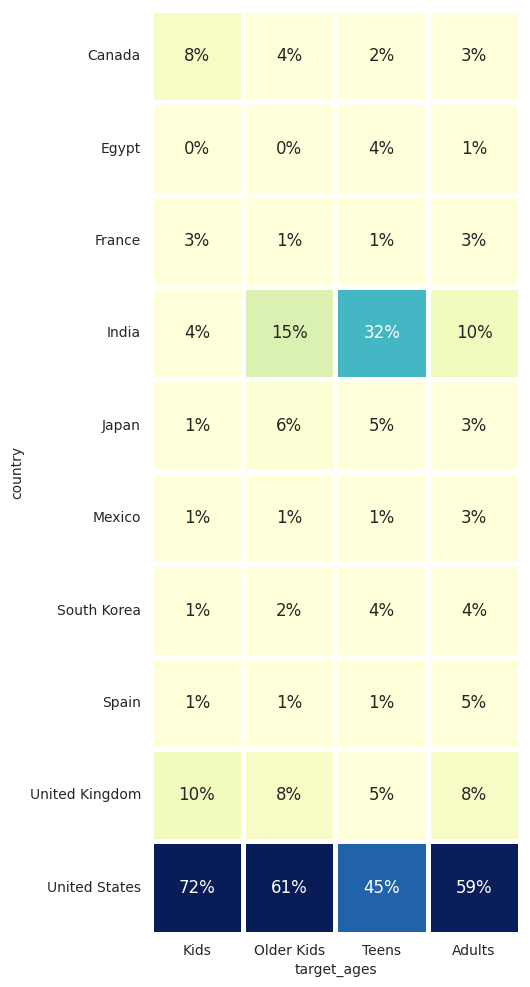

In [ ]:
# Create a heatmap to visualize the relative frequency of content target ages for the top 9 countries
# 'country_order2' specifies the order of countries to be displayed on the heatmap
# 'age_order' specifies the order of content target ages to be displayed on the heatmap
# We use 'df_heatmap' directly without specifying rows using 'loc'

# Set up the figure and axes for the heatmap, with a size of 12x12
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# Define the order of countries to display on the heatmap
country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico']

# Define the order of content target ages to display on the heatmap
age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

# Create the heatmap using 'sns.heatmap()' with the specified parameters
# 'cmap' sets the color map to 'YlGnBu' for a yellow-green-blue gradient
# 'square' ensures that the heatmap cells are square
# 'linewidth' sets the width of the lines between cells to 2.5
# 'cbar' is set to False to hide the color bar
# 'annot' is set to True to display annotations (values) on the heatmap cells
# 'fmt' specifies the format of the annotations as '1.0%' to show percentages without decimals
# 'vmax' and 'vmin' set the upper and lower limits for the color map to enhance visibility
# 'annot_kws' is used to set the font size for annotations
sns.heatmap(df_heatmap, cmap="YlGnBu", square=True, linewidth=2.5, cbar=False,
            annot=True, fmt='1.0%', vmax=.6, vmin=0.05, ax=ax, annot_kws={"fontsize": 12})

# Display the heatmap
plt.show()


##### 1. Why did you pick the specific chart?

**The heatmap was used to visualize the relative frequency of content target ages for the top countries in the Netflix dataset. Heatmaps are particularly effective for displaying the correlation between two categorical variables. In this case, the columns represent different content target ages (e.g., Adults, Teens, Older Kids, Kids), and the rows represent the top countries (e.g., United States, India, United Kingdom, etc.).**

##### 2. What is/are the insight(s) found from the chart?

* The content target ages on Netflix for the United States and the United Kingdom are similar, showing a close alignment between the two countries. However, when compared to countries like India or Japan, their content preferences differ significantly.

* Moreover, Mexico and Spain share similar content on Netflix across various age groups, indicating a similarity in content choices between these two countries despite their distinct geographic locations.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

### **Hypothetical Statement** - Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Null hypothesis (H0):** The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.

**Alternative hypothesis (H1):** The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India..

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Step 1: Filter movies only from the DataFrame 'df'
movies = df[df.type == 'Movie']

# Step 2: Filter movies by country (United States and India)
us_movies = movies[movies.country == 'United States']
india_movies = movies[movies.country == 'India']

# Step 3: Perform the t-test to compare the release years of movies in the US and India
from scipy.stats import ttest_ind

# We use the independent two-sample t-test since we are comparing the means of two groups.
# The assumption 'equal_var=False' means we are not assuming equal variances between the groups.
t_statistic, p_value = ttest_ind(us_movies['release_year'], india_movies['release_year'], equal_var=False)

# Step 4: Print the results
alpha = 0.05  # significance level

# Check if the p-value is less than the significance level to determine the result of the t-test.
if p_value < alpha:
    print("Reject null hypothesis. The average release year of movies on Netflix in the United States is greater than the average release year in India.")
else:
    print("Fail to reject null hypothesis. The average release year of movies on Netflix in the United States is equal to the average release year in India.")


Reject null hypothesis. The average release year of movies on Netflix in the United States is greater than the average release year in India.


##### Which statistical test have you done to obtain P-Value?

 **The p-value was obtained using a two-sample t-test, also known as an independent samples t-test or unpaired t-test. The ttest_ind function from the scipy.stats module was utilized for this purpose. This test is suitable for comparing the means of two independent samples, which in this case involves comparing the number of movies on Netflix between the United States and India.**

**Importantly, the assumption was made that the variances of the two populations are not equal (equal_var=False was set in the ttest_ind function). This decision was reasonable since there may be differences in the variances of the number of movies on Netflix in the United States and India. However, if there were reasons to believe that the variances were equal, a pooled t-test could have been used instead.**

##### Why did you choose the specific statistical test?

**1.** The reason for choosing the two-sample t-test in this analysis is its suitability for comparing the means of two independent samples. In this case, we have two distinct samples of movies on Netflix, one from the United States and another from India, and our objective is to determine if the average number of movies in the United States significantly differs from that in India.

**2.** The t-test is well-suited because the population standard deviations are unknown, and we are working with relatively small sample sizes compared to the total number of movies on Netflix. Hence, using the sample standard deviations to estimate the population standard deviations is necessary.

**3.** Moreover, the t-test assumes that the data follows a normal distribution or is approximately normally distributed. This assumption is reasonable considering the nature of the data being analyzed.

**All in all, the two-sample t-test is a widely accepted and dependable statistical test for comparing means of two independent samples, making it a sound choice for this particular analysis.**

### **Hypothetical Statement** - According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Null hypothesis(H0):** There is no significant difference in the number of movies and TV shows added by Netflix across different months.

**Alternative hypothesis(H1):** There is a significant difference in the number of movies and TV shows added by Netflix across different months.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Import the required libraries
import pandas as pd
import scipy.stats as stats

# Convert the "date_added" column to datetime format
df["date_added"] = pd.to_datetime(df["date_added"])

# Extract the month from the "date_added" column and create a new column 'month_added'
df["month_added"] = df["date_added"].dt.month_name()

# Create a contingency table to count the number of new movies and TV shows added by month
contingency_table = pd.crosstab(df["type"], df["month_added"])

# Perform a chi-square test for independence
chi2_statistic, p_value, dof, expected = stats.chi2_contingency(contingency_table)

# Output the results
print("Chi-square statistic:", chi2_statistic)
print("P-value:", p_value)

Chi-square statistic: 16.048843075375014
P-value: 0.13932726345255042


##### Which statistical test have you done to obtain P-Value?

**The p-value was obtained through a chi-square test for independence, which is used to assess whether there is a meaningful connection between two categorical variables. In this analysis, we aimed to determine if there is a significant association between the time of year and the number of new movies and TV shows added to Netflix. The test involves comparing the actual frequencies of occurrences in a contingency table (which presents the data's distribution) to the expected frequencies based on the assumption of independence.**

**To compute the test statistic, the squared differences between observed and expected frequencies are summed up, and this statistic follows a chi-square distribution. By calculating the p-value, we ascertain the probability of obtaining a test statistic as extreme or more extreme than the observed one, under the assumption that the null hypothesis (indicating independence) is true. A p-value lower than the chosen significance level (typically 0.05) leads us to reject the null hypothesis and conclude that a significant association exists between the two categorical variables being examined.**

##### Why did you choose the specific statistical test?

**1.** The chi-square test for independence was chosen to investigate any potential relationship between the time of year and the number of new Netflix movies and TV shows.

**2.** This test is suitable for analyzing categorical variables, comparing observed and expected distributions under the assumption of independence.

**3.** The resulting p-value helps determine if there is significant evidence to reject the null hypothesis and conclude whether an association between the two variables exists.

### **Hypothetical Statement** - The number of movies on Netflix is greater than the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Null hypothesis(H0):** The number of movies and TV shows on Netflix is not significantly different.

**Alternative hypothesis(H1):** The number of movies on Netflix is significantly greater than the number of TV shows.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

# Import the required library
from statsmodels.stats.proportion import proportions_ztest

# Count the number of movies and TV shows
n_movies = df[df['type'] == 'Movie'].count()['type']
n_tv_shows = df[df['type'] == 'TV Show'].count()['type']

# Set up the counts and sample sizes for the z-test
counts = [n_movies, n_tv_shows]
nobs = [len(df), len(df)]

# Perform the z-test assuming equal proportions (null hypothesis: proportion of movies and TV shows is equal)
z_stat, p_val = proportions_ztest(counts, nobs, value=0, alternative='larger')

# Output the results
print('Number of movies:', n_movies)
print('Number of TV shows:', n_tv_shows)
print('z-statistic:', z_stat)
print('p-value:', p_val)

Number of movies: 5372
Number of TV shows: 2398
z-statistic: 47.71395895355864
p-value: 0.0


##### Which statistical test have you done to obtain P-Value?

**A two-sample z-test for proportions was employed to obtain the p-value. The test aimed to assess whether the proportion of movies and TV shows on Netflix is equal (null hypothesis) or if the proportion of movies is greater than the proportion of TV shows (alternative hypothesis). The proportions_ztest() function from the statsmodels library was used for this test, calculating the z-score and the p-value based on the sample proportions, sample sizes, and the specified null hypothesis value.**

##### Why did you choose the specific statistical test?

**1.** The two-sample z-test for proportions was chosen to compare the number of movies and TV shows on Netflix due to the categorical nature of the data. The objective was to determine if there is a significant difference in the proportions of these categories in the overall population.

**2.** This test is appropriate when dealing with two independent samples and comparing the proportion of successes in each sample, where success corresponds to either a movie or a TV show.

**3.** The z-test assumes that the sample sizes are large enough to apply the normal approximation to the binomial distribution, which is valid in this case, given the sizable sample size, enabling us to effectively test the hypothesis of interest.

## ***6. Feature Engineering & Data Pre-processing***

### ***Data Cleaning***

In [ ]:
# Step 1: Calculate the number of missing values in each column using the isna() method.
missing_count = df.isna().sum()

# Step 2: Calculate the total number of rows in the DataFrame.
total_rows = len(df)

# Step 3: Calculate the percentage of missing data for each column.
missing_percentage = (missing_count / total_rows) * 100

# Step 4: Round the percentages to two decimal places using the round() function.
rounded_percentage = missing_percentage.round(2)

# Step 5: Sort the percentages in descending order to find the columns with the most missing data.
sorted_percentage = rounded_percentage.sort_values(ascending=False)

# Step 6: Print the result, which shows the percentage of missing data for each column in descending order.
print(sorted_percentage)


show_id         0.0
type            0.0
title           0.0
director        0.0
cast            0.0
country         0.0
date_added      0.0
release_year    0.0
rating          0.0
duration        0.0
listed_in       0.0
description     0.0
target_ages     0.0
month           0.0
dtype: float64


In [ ]:
# Step 1: Fill missing values in the 'director', 'cast', and 'country' columns with empty strings.
df[['director', 'cast', 'country']] = df[['director', 'cast', 'country']].fillna(' ')

# Step 2: Drop rows with any remaining missing values after filling the above columns.
df.dropna(axis=0, inplace=True)


In [ ]:
# Step 1: Check for null values in the DataFrame after treating missing values.
null_counts_after_treatment = df.isna().sum()

# Step 2: Print the result to see if there are any null values in each column.
print(null_counts_after_treatment)


show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
target_ages     0
month           0
dtype: int64


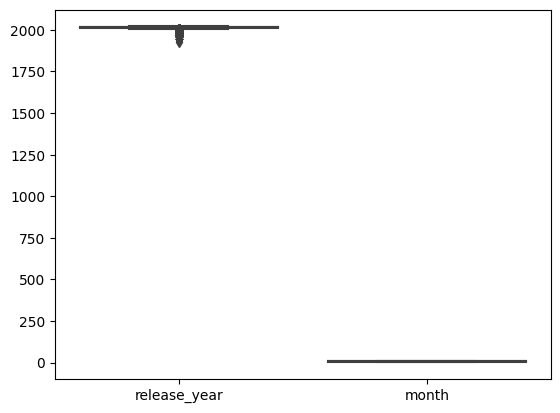

In [ ]:
# Step 1: Import the necessary libraries.
import seaborn as sns
import matplotlib.pyplot as plt

# Step 2: Create a boxplot to visualize the distribution of the data and detect outliers.
#          The boxplot helps identify data points that are far from the central distribution.
#          Outliers are the points that lie beyond the "whiskers" of the boxplot.
#          Seaborn's boxplot function is used, and the DataFrame 'df' is passed as the data.
sns.boxplot(data=df)

# Step 3: Display the plot.
plt.show()


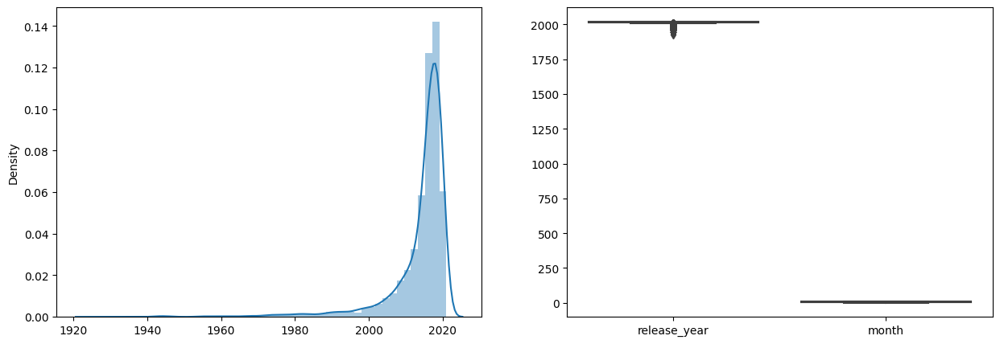

In [ ]:
# Handling Outliers & Outlier treatments

# Step 1: Create a figure with two axes (subplots) to display the distribution plot and boxplot side by side.
#          'fig' represents the entire figure, and 'ax' contains the two subplots (1 row, 2 columns).
#          The figure size is set to (15, 5) using 'figsize'.
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Step 2: Plot the distribution plot on the first subplot (ax[0]).
#          The distribution plot helps visualize the data's frequency distribution.
#          We use Seaborn's 'distplot' function to create the distribution plot for the 'release_year' column of 'df'.
sns.distplot(x=df['release_year'], ax=ax[0])

# Step 3: Plot the boxplot on the second subplot (ax[1]).
#          The boxplot helps identify outliers in the 'release_year' column.
#          We use Seaborn's 'boxplot' function to create the boxplot for the entire DataFrame 'df'.
sns.boxplot(data=df, ax=ax[1])


# Step 4: Display the plots.
plt.show()


**1.** With the exception of the release year, the majority of the data is provided in textual form.

**2.** The text-based format contains all the necessary data for constructing a clustering or predictive model, rendering outlier handling unnecessary.

### ***Textual Data Preprocessing***

**What is Textual Data Preprocessing ?**

Textual data preprocessing refers to the set of actions taken to get text data ready for analysis or modeling purposes. These steps involve cleaning, organizing, and standardizing raw text, making it suitable for natural language processing or machine learning models. The process includes **tokenization**, **stop-word removal**, **stemming** or **lemmatization**, **converting to lowercase**, **eliminating punctuation**, and **getting rid of numbers**. The ultimate objective of textual data preprocessing is to make the data more suitable for analysis and modeling by removing irrelevant details and standardizing the text format. This enhances the accuracy and efficiency of subsequent analyses and modeling tasks.

**Modeling Approch**

**1.** Similar to organizing a cluttered closet by grouping items with similar attributes, clustering is a technique used to group similar data points together. In this case, we apply clustering to a set of movies to discover patterns and categorize them based on their attributes.

**2.** Before performing clustering, we need to preprocess the textual data, just like sorting clothes by color or size. This involves techniques like lowercasing, removing punctuation, and eliminating stopwords (common words without significant meaning). We also use stemming or lemmatization to normalize words and reduce them to their base form. Additionally, tokenization is applied to break the text into smaller units like sentences or words.

**3.** Now that the data is cleaned up, we can proceed with clustering. However, like folding clothes to save space in the closet, we first need to reduce the dimensionality of the data. This step helps in efficient clustering. Various algorithms can be employed to cluster the movies, and we can use techniques to determine the optimal number of clusters.

**4.** After constructing the optimal clusters, we can explore their contents using word clouds, which are like showcasing the unique personality of each cluster. Word clouds visually represent the most frequently occurring words in each cluster in a creative and engaging manner. Through this, we gain insights into the distinctive characteristics that define each cluster and identify the common patterns that connect the movies within each group.

### ***Selecting Attributes***

In [ ]:
# Generating a "tags" Column from Textual Data for Model Building
df['tags'] = df['description'] + df['listed_in'] + df['rating'] + df['cast'] + df['country'] + df['director']

In [ ]:
# Extracting the "tags" column data for the first row (index 0) of the DataFrame 'df'.
tags_data = df.tags[0]

# Displaying the "tags" data for the first row.
print(tags_data)


In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.International TV Shows, TV Dramas, TV Sci-Fi & FantasyTV-MAJoão Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazilNA


**The consolidation of all essential data into a single column has been completed successfully.**

**Removing Stopwords and Lower Casing:** In natural language processing **(**NLP**)** tasks, standard pre-processing steps often involve the removal of stop words and converting words to lowercase.

**Stop words** are frequently used words in a language that lack substantial meaning, like "a," "an," "the," and "is." Since they can introduce unnecessary noise and potentially impact the performance of NLP models, it is common to exclude them as a pre-processing measure.

**Lowercasing** words involves converting all the words in a text to lowercase. This is a prevalent pre-processing technique in NLP tasks for several beneficial reasons:

**1. Case differences can be ignored:** By lowercasing the words, you can treat words with different capitalization as the same word, which can be useful in tasks such as information retrieval or text classification where case differences are not important.

**2. Vocabulary size is reduced:** Lowercasing the words can also reduce the size of the vocabulary, which can make it easier to work with larger texts or texts in languages with a high number of inflected forms.

In [ ]:
# Step 1: Check if the stop words list is already downloaded; if not, download it.
import nltk
nltk.download('stopwords')

# Step 2: Create a set of English stop words.
#          Stop words are common words in the English language that are often removed from text data for NLP tasks.
#          By creating a set of stop words, we can efficiently check for their presence in text and exclude them if necessary.
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

# Step 3: Display the set of stop words.
#          By converting the list of stop words into a NumPy array, we can easily examine and work with the stop words.
import numpy as np
stop_words_array = np.array(list(stop_words))
print(stop_words_array)


['this' 'until' 'after' "haven't" 'll' 'each' 'haven' 'again' "weren't"
 've' 'were' 'because' 'during' 'was' 'an' 'them' "didn't" 'where'
 'couldn' 'you' 'some' 'out' 'but' 're' 'shan' 'myself' 'at' 'nor' 'm'
 "doesn't" "don't" "should've" 'above' 'me' 'by' 'about' 'i' 'wouldn'
 'won' 't' 'is' "she's" "you'd" 'further' 'aren' 'for' 'weren' 'a' 'isn'
 "it's" 'who' 'd' 'herself' 'down' 'his' 'be' 'just' 'wasn' 'all' 'ain'
 'mustn' 'any' 'both' 'once' 'which' 'over' 'between' 'other' 'mightn'
 'my' 'ourselves' 'does' "you've" 'with' 'theirs' 'should' "shan't"
 'shouldn' 'while' 'are' 'it' 'having' "mustn't" 'has' "hasn't" 'her' 'in'
 'under' 'own' 'will' 'more' 'yours' 'ma' 'to' 'if' 'so' 'itself' 'these'
 'of' 'can' 'not' 'do' 'through' 'such' 'here' 'no' 'their' 'now' 'only'
 "won't" "needn't" "mightn't" 'and' "wasn't" 'from' "you'll" 'they' 'he'
 'y' "hadn't" 'why' 'o' 'up' "isn't" 'on' "shouldn't" 'hadn' 'against'
 'into' 'needn' 'yourselves' 'the' 'what' 'did' "couldn't" 'been' 'bel

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Removing the stopwords
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # Joining the list of words with space separator
    return " ".join(text)


In [ ]:
# Applying the stopwords function
df['tags'] = df['tags'].apply(stopwords)

In [ ]:
# Displaying the "tags" data for the first row.
df.tags[0]

'future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.international tv shows, tv dramas, tv sci-fi & fantasytv-majoão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibrazilna'

**The process of removing all the stopwords and converting the corpus to lowercase has been completed successfully.**

### ***Removing Punctuations***

In NLP tasks, it is customary to remove punctuation as a standard pre-processing step. Punctuation marks, such as periods, commas, and exclamation points, can introduce unnecessary noise to the data and may be treated as separate tokens, potentially impacting the performance of NLP models.

In [ ]:
# Function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # Replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # Return the text stripped of punctuation marks
    return text.translate(translator)


In [ ]:
# Applying the remove_punctuation function
df['tags'] = df['tags'].apply(remove_punctuation)

In [ ]:
# Displaying the "tags" data for the first row.
df.tags[0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalorinternational tv shows tv dramas tv scifi  fantasytvmajoão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazilna'

**The successful removal of all punctuation marks from the corpus has been achieved.**

### ***Stemming***

The **SnowballStemmer** was utilized to transform a corpus of words into meaningful word stems. Stemming is a prevalent pre-processing technique in NLP tasks, which involves reducing words to their base or root form. This process enables treating various inflected forms of a word as equivalent, proving advantageous for tasks such as information retrieval or text classification.

For instance, words like **"run,"** **"runs,"** **"ran,"** and **"running"** can all be stemmed to their base form **"run,"** facilitating better analysis and understanding of the text data.

In [ ]:
# Step 1: Import the SnowballStemmer from NLTK library.
from nltk.stem.snowball import SnowballStemmer

# Step 2: Create an instance of the SnowballStemmer with the language specified as "english".
stemmer = SnowballStemmer("english")

# Step 3: Define the 'stemming' function.
#         This function takes a text as input and stems each word in the text using the SnowballStemmer.
def stemming(text):
    # Step 3.1: Split the input text into individual words.
    words = text.split()

    # Step 3.2: Apply stemming to each word in the list using the stemmer object.
    stemmed_words = [stemmer.stem(word) for word in words]

    # Step 3.3: Join the stemmed words back into a single string.
    stemmed_text = " ".join(stemmed_words)

    # Step 3.4: Return the resulting stemmed text.
    return stemmed_text


In [ ]:
# Applying the stemming function.
df['tags'] = df['tags'].apply(stemming)

In [ ]:
# Displaying the "tags" data for the first row.
df.tags[0]

'futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalorintern tv show tv drama tv scifi fantasytvmajoão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazilna'

**The corpus has undergone stemming process.**

### ***Text Vectorization***

**Word** or **text vectorization** is the process of converting words into numerical vectors. This is crucial in NLP tasks because many machine learning models require numerical input and cannot directly handle raw text data. Word vectorization enables representing words in a manner that retains their meaning and context, making it possible to use them as input for machine learning models. Additionally, word vectorization can be utilized to gauge the similarity between words through vector arithmetic.

In [ ]:
# Creating the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # Max features = 10000 to prevent system from crashing

# Fitting the vectorizer using the text data
tfidf.fit(df['tags'])

# Collecting the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [ ]:
# Printing the results
print(len(dictionary)) # Number of independent features created from "tags" columns > max_features = 10000

10000


In [ ]:
# Converting the vector into array form for clustering
vector = tfidf.transform(df['tags']).toarray()

# Summarizing the encoded vector
print(vector)
print(f'Shape of the vector : {vector.shape}')
print(f'Datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Shape of the vector : (7770, 10000)
Datatype : <class 'numpy.ndarray'>


### ***Dimensionality Reduction***

**PCA (Principal Component Analysis)** can be employed to reduce the dimensionality of data.

Dimensionality reduction refers to the process of decreasing the number of features or dimensions in a dataset while retaining relevant information. This step is frequently employed in machine learning and data analysis due to the challenges posed by high-dimensional datasets and the potential issues associated with the curse of dimensionality.

In [ ]:
# Step 1: Import the necessary library for PCA.
from sklearn.decomposition import PCA

# Step 2: Create an instance of the PCA class with a specified random state for reproducibility.
pca = PCA(random_state=42)

# Step 3: Fit the PCA model to the input data (vector).
#         PCA will learn the principal components from the data and reduce the dimensionality.
pca.fit(vector)


PCA(random_state=42)

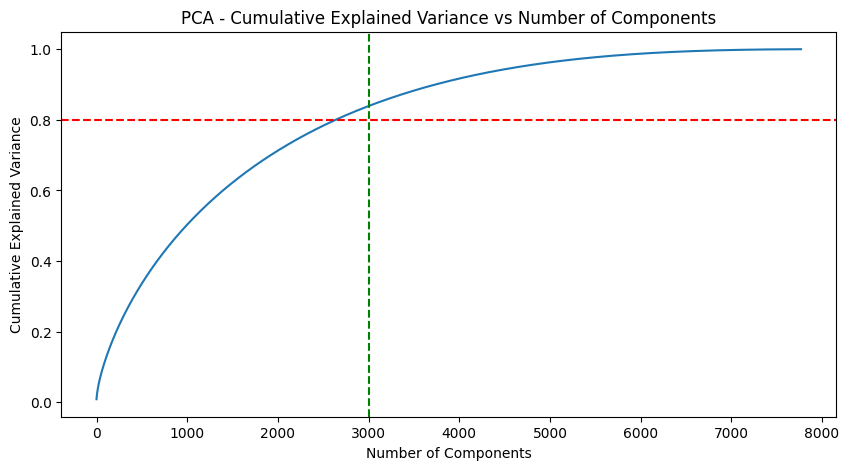

In [ ]:
# Explained variance for different number of components

# Step 1: Create a figure with a specific size to plot the results.
plt.figure(figsize=(10, 5))

# Step 2: Plot the cumulative explained variance for different numbers of components.
#         The cumulative explained variance is obtained from the PCA object (pca) using 'explained_variance_ratio_'.
#         np.cumsum() is used to compute the cumulative sum of explained variance for each component.
plt.plot(np.cumsum(pca.explained_variance_ratio_))

# Step 3: Customize the plot with title, axis labels, and style.
plt.title('PCA - Cumulative Explained Variance vs Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

# Step 4: Add horizontal and vertical lines to indicate certain thresholds or points of interest.
#         In this case, we add a red dashed line at y=0.8 to show the 80% cumulative explained variance threshold.
#         We also add a green dashed line at x=3000 to mark the number of components at a specific point of interest.
plt.axhline(y=0.8, color='red', linestyle='--')
plt.axvline(x=3000, color='green', linestyle='--')

# Step 5: Display the plot.
plt.show()


**1.** After analyzing the cumulative explained variance plot, we observe that approximately ~**7500** components are required to explain **100%** of the variance in the data.

**2.** However, a significant portion of the variance **(more than 80%)** can be explained by just **3000** components.

**3.** Therefore, to simplify the model and reduce dimensionality while still capturing a substantial amount of variance, we can choose to retain the top 3000 components. This decision will enable us to maintain a balance between model complexity and explanatory power, as it still accounts for more than 80% of the total variance in the data.

In [ ]:
# Reducing the dimensions to 3000 using PCA

# Step 1: Create an instance of the PCA class with the desired number of components (n_components=3000).
#         Set a random state for reproducibility of results.
pca = PCA(n_components=3000, random_state=42)

# Step 2: Fit the PCA model to the input data (vector) with the chosen number of components (3000).
#         PCA will learn the principal components from the data and reduce the dimensionality to 3000 components.
pca.fit(vector)


PCA(n_components=3000, random_state=42)

In [ ]:
# Step 1: Transform the input data 'vector' using the previously fitted PCA model.
#         The transformed data will have reduced dimensions based on the chosen number of components (3000).
X = pca.transform(vector)

# Step 2: Check the shape of the transformed data 'X'.
#         The 'shape' attribute of the transformed data provides the number of rows (samples) and columns (components).
transformed_shape = X.shape

# Step 3: Print the shape of the transformed data to view the number of samples and components.
print(transformed_shape)


(7770, 3000)


## ***7. Clusters Implementation***

### ML Model - 1 | **K-Means Clustering**

K-means clustering is an unsupervised machine learning method employed to partition a dataset into a predetermined number of clusters. It is referred to as **"unsupervised"** because the algorithm does not depend on labeled examples for learning. Instead, it leverages the intrinsic patterns within the data to group the samples into clusters.

**How it Works?**

**1.** The k-means algorithm begins by randomly choosing k initial "centroids" or cluster centers from the data.

**2.** Next, it assigns each sample in the dataset to the closest centroid, using a distance metric like Euclidean distance.

**3.** The algorithm then updates the centroids by calculating their means based on the samples in each cluster.

**4.** It iteratively repeats the process of reassigning samples to the nearest centroids and updating the centroids until convergence.

**5.** To determine the optimal number of clusters for the K-means algorithm, one can visualize the elbow curve and Silhouette score. These methods help in finding the number of clusters that best capture the data's underlying structure.

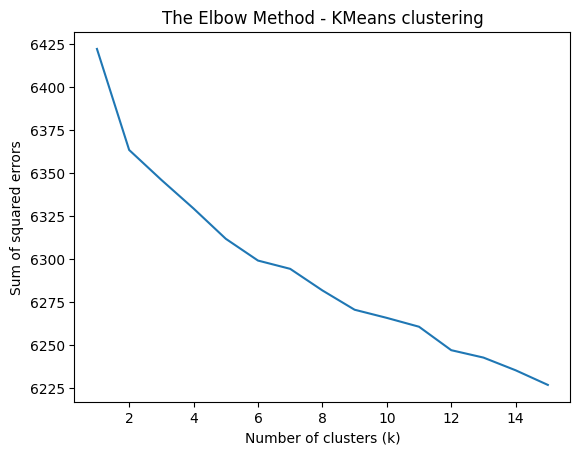

In [ ]:
# Elbow Method
'''Elbow method to find the optimal value of k'''

# Initialize an empty list to store the sum of squared errors for each value of k
sum_squared_errors = []

# Loop through different values of k from 1 to 15
for k in range(1, 16):
    # Initialize the KMeans model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)

    # Fit the KMeans model to the data
    kmeans.fit(X)

    # Compute the sum of squared errors for the current model
    sum_squared_errors.append(kmeans.inertia_)

# Plot the values of sum of squared errors against the number of clusters (k)
plt.plot(range(1, 16), sum_squared_errors)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of squared errors')
plt.show()


**As the number of clusters increases, the sum of squared distances between each point and its corresponding centroid in the cluster decreases.**

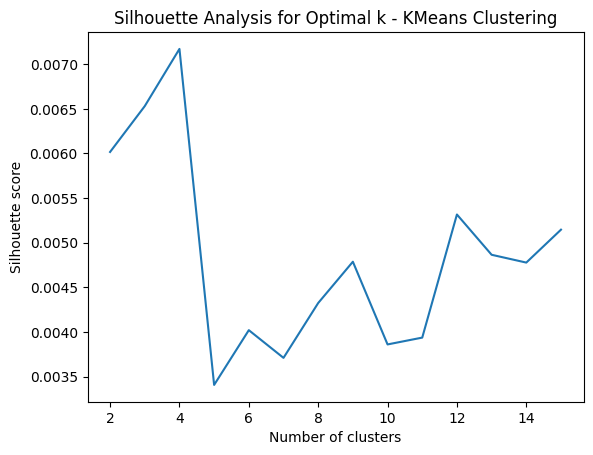

In [ ]:
# Silhoutte score method
'''Silhouette score method to find the optimal value of k'''

# Initialize an empty list to store the silhouette score for each value of k (number of clusters)
silhouette_avg = []

# Loop through different values of k from 2 to 15
for k in range(2, 16):
    # Initialize the KMeans model with the current value of k
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)

    # Fit the KMeans model to the data (X)
    kmeans.fit(X)

    # Predict the cluster labels for each data point
    labels = kmeans.labels_

    # Compute the silhouette score for the current model
    score = silhouette_score(X, labels)

    # Append the computed silhouette score to the silhouette_avg list
    silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2, 16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette Analysis for Optimal k - KMeans Clustering')
plt.show()


**The number of clusters that yields the highest Silhouette score is 5.**

### ***Building 5 clusters using the k-means clustering algorithm:***

In [ ]:
# Clustering the data into 5 clusters

# Initialize the KMeans model with 5 clusters, using 'k-means++' as the initialization method and setting random_state to 33 for reproducibility
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=33)

# Fit the KMeans model to the data (X)
kmeans.fit(X)


KMeans(n_clusters=5, random_state=33)

In [ ]:
# Calculate the distortion (inertia) and Silhouette score for the KMeans clustering result
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

# Print the calculated distortion and Silhouette score
print("Distortion (Inertia):", kmeans_distortion)
print("Silhouette Score:", kmeans_silhouette_score)


Distortion (Inertia): 6313.4810579010355
Silhouette Score: 0.003217221362306499


In [ ]:
# Add a new column 'kmeans_cluster' to the DataFrame 'df' containing the cluster numbers assigned by KMeans
df['kmeans_cluster'] = kmeans.labels_


In [ ]:
# Print a random sample of 5 rows from the DataFrame 'df', showing selected columns along with the KMeans cluster number
df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
4149,Movie,Mission Istaanbul: Darr Ke Aagey Jeet Hai,Apoorva Lakhia,"Vivek Oberoi, Zayed Khan, Shriya Saran, Nikiti...",India,TV-MA,"Action & Adventure, International Movies, Musi...",A television journalist makes a risky career m...,3
7065,TV Show,Three Wives One Husband,NA,No cast,United Kingdom,TV-14,"British TV Shows, International TV Shows, Real...",A film crew captures a year in the life of mod...,4
7319,Movie,Unbreakable Kimmy Schmidt: Kimmy vs. the Reverend,Claire Scanlon,"Ellie Kemper, Jane Krakowski, Tituss Burgess, ...",United States,TV-14,Comedies,It's an interactive Kimmy special! Kimmy's get...,1
2777,TV Show,Hollywood,NA,"David Corenswet, Darren Criss, Patti LuPone, J...",United States,TV-MA,TV Dramas,"In post-World War II Hollywood, an ambitious g...",1
1187,Movie,Camera Store,Scott Marshall Smith,"John Larroquette, John Rhys-Davies, Paul Ben-V...",United States,TV-MA,"Comedies, Dramas",With the digital revolution just around the co...,1


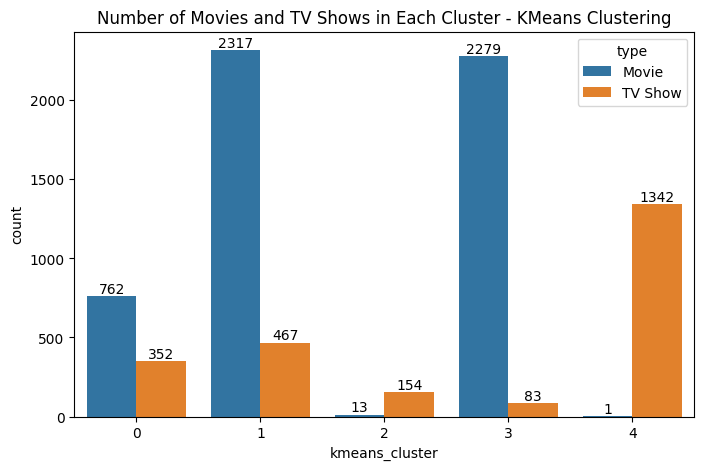

In [ ]:
# Set the figure size for the plot
plt.figure(figsize=(8, 5))

# Create a countplot to show the number of movies and TV shows in each KMeans cluster, with 'type' as the hue
graph = sns.countplot(x='kmeans_cluster', data=df, hue='type')

# Set the title for the plot
plt.title('Number of Movies and TV Shows in Each Cluster - KMeans Clustering')

# Add value counts on top of each bar to display the actual counts
for p in graph.patches:
    # Get the height of the bar
    bar_height = p.get_height()
    # Annotate the bar with its value count, rounded to integer using '.0f' format
    graph.annotate(format(bar_height, '.0f'), (p.get_x() + p.get_width() / 2, bar_height),
                   ha='center', va='bottom')

# Display the plot
plt.show()


**The k-means clustering algorithm has been applied to successfully create 5 distinct clusters.**

**Building wordclouds for different clusters in K-Means Clustering**

In [ ]:
# Function for building a word cloud for movies/shows in a specific cluster
def kmeans_wordcloud(cluster_number, column_name):
    '''
    Build a word cloud for the specified cluster.

    Parameters:
        cluster_number (int): The cluster number for which the word cloud will be created.
        column_name (str): The name of the column containing text data (e.g., 'description', 'cast').

    Returns:
        None
    '''

    # Create a DataFrame containing the specified cluster's data for the given column and remove any NaN values
    df_wordcloud = df[['kmeans_cluster', column_name]].dropna()
    df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster'] == cluster_number]

    # Combine all text documents into a single string
    text = " ".join(word for word in df_wordcloud[column_name])

    # Create the word cloud using the WordCloud class from the wordcloud library
    wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

    # Display the word cloud image
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


***Word Cloud on "description" column for different cluster***

**description**

cluster 0


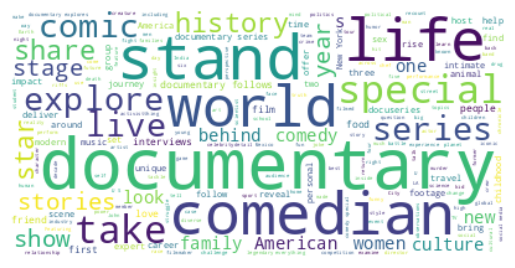

cluster 1


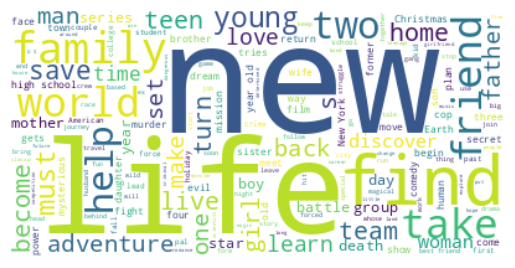

cluster 2


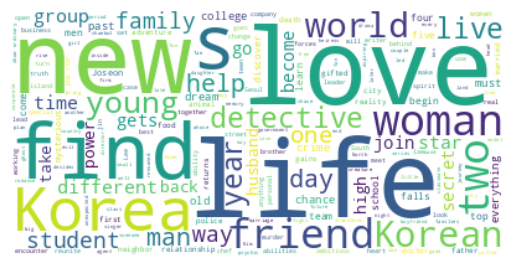

cluster 3


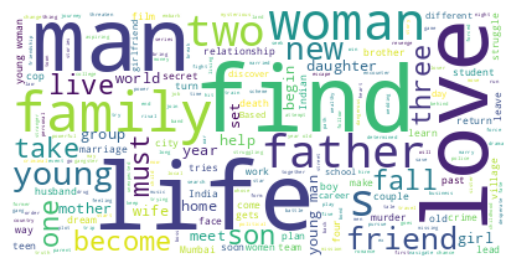

cluster 4


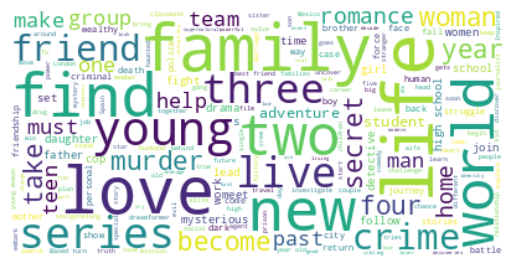

In [ ]:
# description
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'description')

***Word Cloud on "cast" column for different cluster***

**cast**

cluster 0


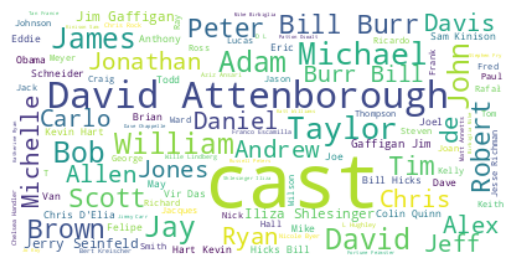

cluster 1


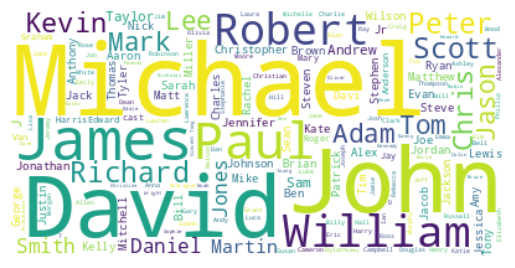

cluster 2


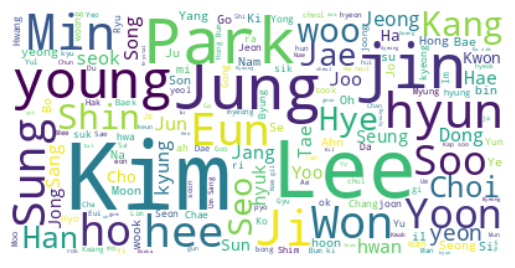

cluster 3


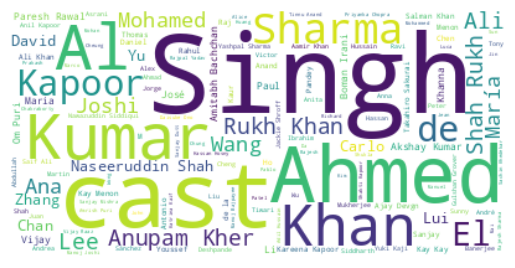

cluster 4


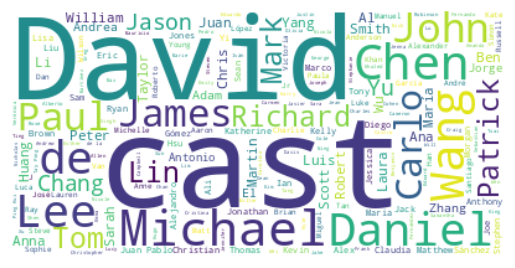

In [ ]:
# cast
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'cast')

***Word Cloud on "director" column for different cluster***

**director**

cluster 0


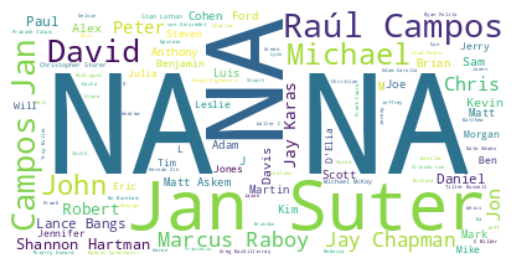

cluster 1


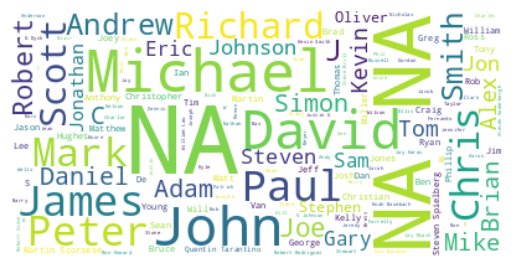

cluster 2


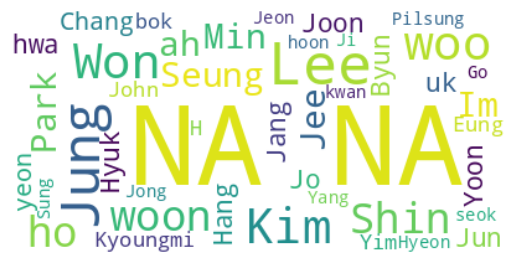

cluster 3


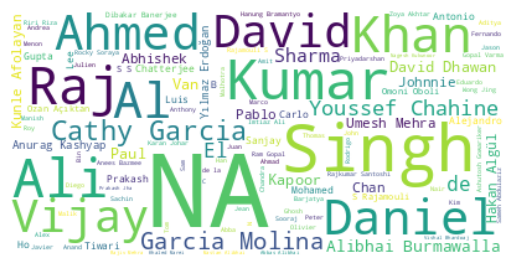

cluster 4


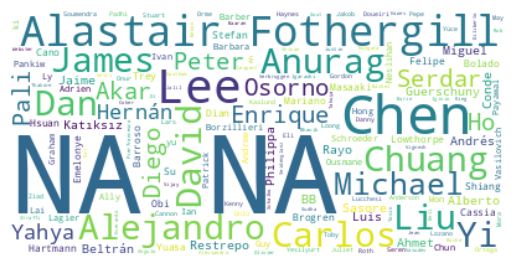

In [ ]:
# director
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'director')

***Word Cloud on "listed_in" column for different cluster***

**listed_in**

cluster 0


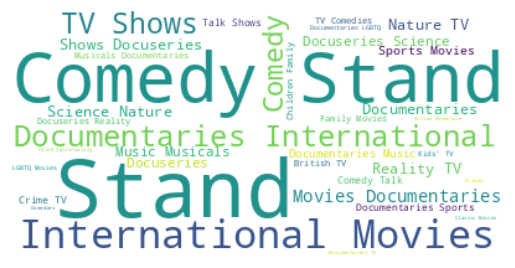

cluster 1


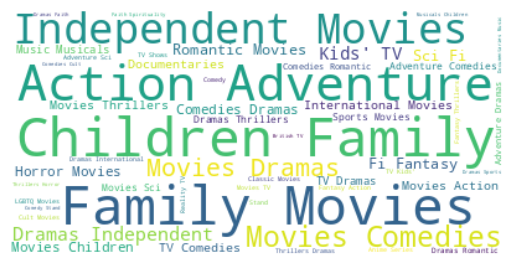

cluster 2


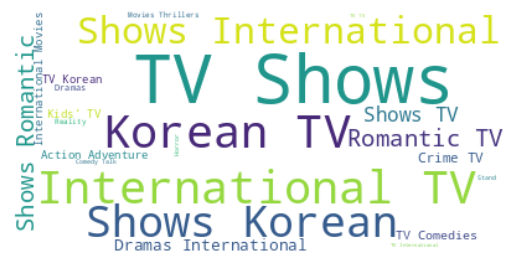

cluster 3


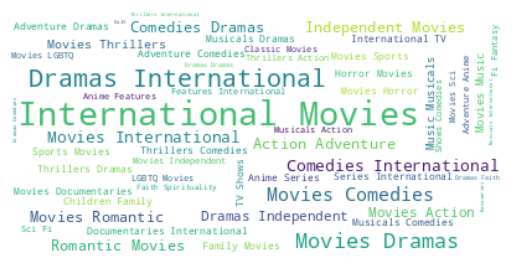

cluster 4


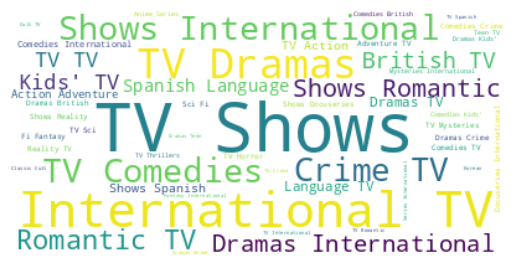

In [ ]:
# listed_in
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'listed_in')

***Word Cloud on "country" column for different cluster***

**country**

cluster 0


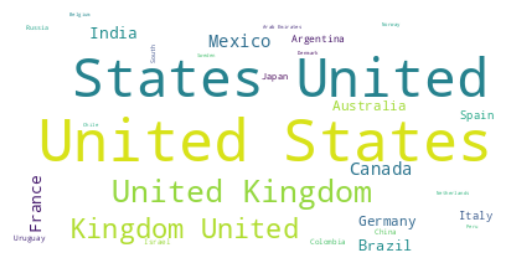

cluster 1


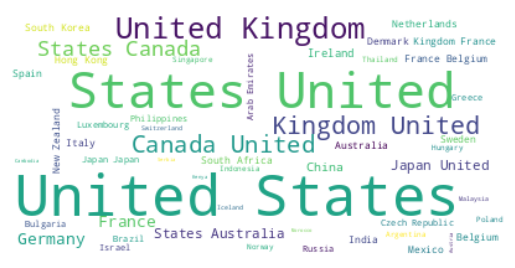

cluster 2


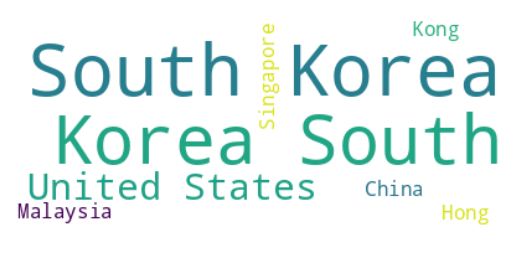

cluster 3


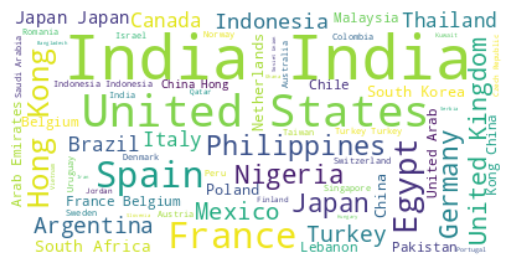

cluster 4


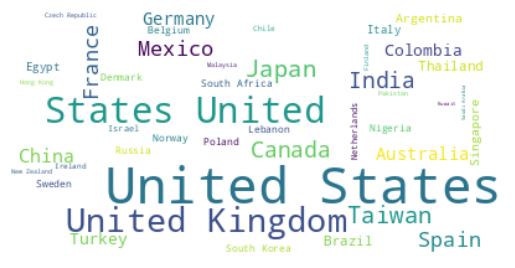

In [ ]:
# country
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'country')

***Word Cloud on "title" column for different cluster***

**title**

cluster 0


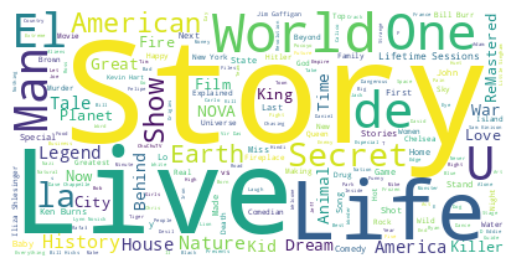

cluster 1


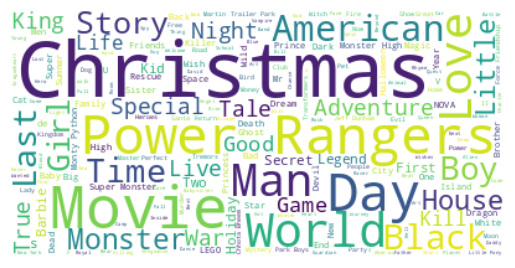

cluster 2


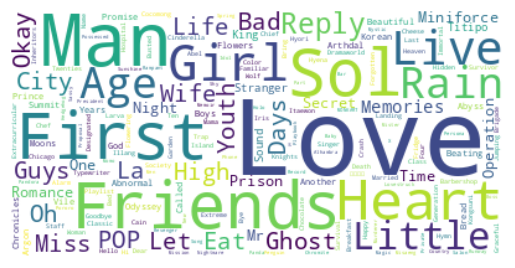

cluster 3


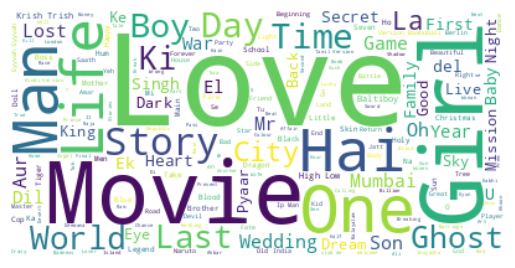

cluster 4


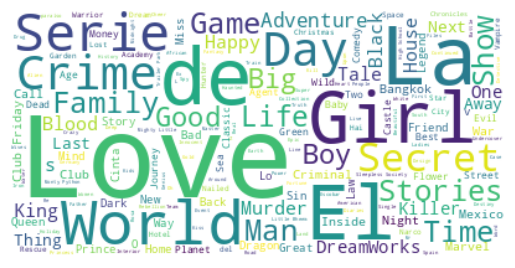

In [ ]:
# title
for i in range(5):
  print(f'cluster {i}')
  kmeans_wordcloud(i,'title')

### ML Model - 2 | **Hierarchical Clustering**

After applying the agglomerative hierarchical clustering algorithm, the resulting clusters are visualized in a dendrogram, which represents a tree-like structure. The dendrogram provides insights into the relationships between the clusters at each level of the hierarchy.

To identify the ideal number of clusters for our dataset, we examine the dendrogram visually. We look for the most extended vertical distance that does not intersect any horizontal line. This distance indicates the greatest dissimilarity between any two merged clusters.

By drawing a horizontal line at this distance and counting the number of vertical lines it intersects, we can determine the optimal number of clusters for our data. This number represents the most suitable segmentation of the dataset into distinct groups.

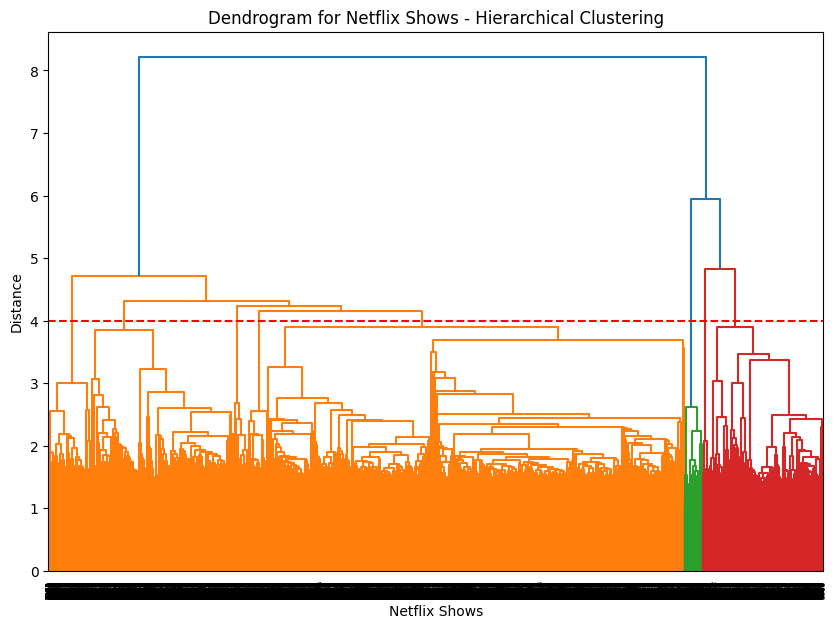

In [ ]:
# Building a dendogram to decide the number of clusters

# Set the figure size for the dendrogram plot
plt.figure(figsize=(10, 7))

# Create the dendrogram using the linkage method 'ward' and plot it
dendrogram = shc.dendrogram(shc.linkage(X, method='ward'))

# Set the title, x-axis label, and y-axis label for the dendrogram plot
plt.title('Dendrogram for Netflix Shows - Hierarchical Clustering')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')

# Draw a horizontal line at y=4 to mark the threshold distance for identifying clusters
plt.axhline(y=4, color='r', linestyle='--')

# Display the dendrogram plot
plt.show()


**At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.**

***Building 7 clusters using the Agglomerative clustering algorithm:***

In [ ]:
# Initialize the Hierarchical Clustering model with 7 clusters, using Euclidean distance as the affinity measure and Ward linkage for clustering
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')

# Fit the model to the data and obtain the cluster labels for each data point
cluster_labels = hierarchical.fit_predict(X)


In [ ]:
# Create a new column 'hierarchical_cluster' in the DataFrame 'df'
# The values for this column are obtained from the hierarchical clustering model's labels attribute
df['hierarchical_cluster'] = hierarchical.labels_


In [ ]:
# Select a random sample of 5 rows from the DataFrame 'df', showing specific columns along with the hierarchical cluster number
df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
2283,Movie,Freshman Year,Jude Okwudiafor Johnson,"Diallo Thompson, Natalia Dominguez, Benjamin A...",United States,TV-PG,"Dramas, Faith & Spirituality",A devout preacher's son leaves his protective ...,0
2664,Movie,Hazel Brugger: Tropical,NA,Hazel Brugger,Germany,TV-MA,Stand-Up Comedy,"In this stand-up special, comedian Hazel Brugg...",2
1732,Movie,Dhamaal,Indra Kumar,"Sanjay Dutt, Riteish Deshmukh, Arshad Warsi, A...",India,TV-14,"Action & Adventure, Comedies, International Mo...","Tipped off about buried money in Goa, four ne’...",4
4063,Movie,Mi Shivajiraje Bhosale Boltoy,Santosh Manjrekar,"Sachin Khedekar, Mahesh Manjrekar, Makarand An...",India,TV-14,"Comedies, International Movies, Sci-Fi & Fantasy",After a disgruntled man blames his Marathi her...,0
1926,Movie,Edoardo Ferrario: Temi Caldi,Francesco Imperato,Edoardo Ferrario,Italy,TV-MA,Stand-Up Comedy,Italian comedian Edoardo Ferrario riffs on lif...,2


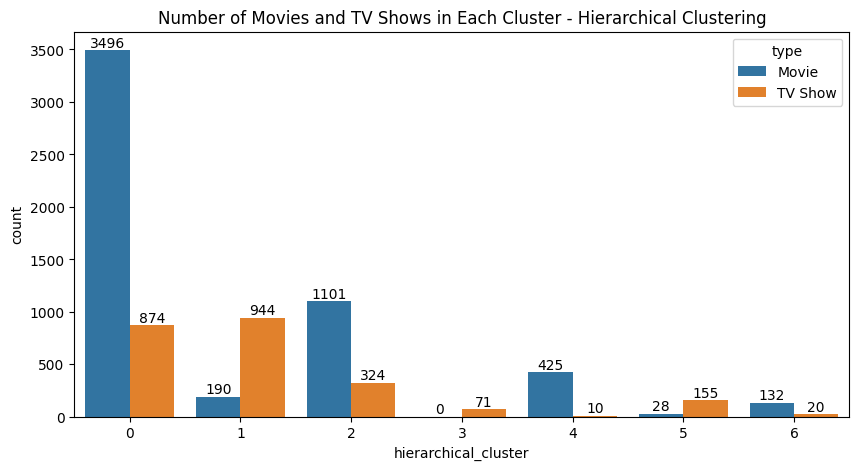

In [ ]:
# Number of movies and tv shows in each cluster

# Set the figure size for the plot
plt.figure(figsize=(10, 5))

# Create a countplot to show the number of movies and TV shows in each hierarchical cluster, with 'type' as the hue
graph = sns.countplot(x='hierarchical_cluster', data=df, hue='type')

# Set the title for the plot
plt.title('Number of Movies and TV Shows in Each Cluster - Hierarchical Clustering')

# Add value counts on top of each bar to display the actual counts
for p in graph.patches:
    # Get the height of the bar
    bar_height = p.get_height()
    # Annotate the bar with its value count, rounded to integer using '.0f' format
    graph.annotate(format(bar_height, '.0f'), (p.get_x() + p.get_width() / 2, bar_height),
                   ha='center', va='bottom')

# Display the plot
plt.show()


**The Agglomerative (hierarchical) clustering algorithm has been applied successfully to create 7 distinct clusters.**

**Building wordclouds for different clusters in Hierarchical Clustering**

In [ ]:
# Function for building a word cloud for movies/shows in a specific hierarchical cluster
def hierarchical_wordcloud(cluster_number, column_name):
    '''
    Build a word cloud for the specified hierarchical cluster.

    Parameters:
        cluster_number (int): The cluster number for which the word cloud will be created.
        column_name (str): The name of the column containing text data (e.g., 'description', 'cast').

    Returns:
        None
    '''

    # Create a DataFrame containing the specified hierarchical cluster's data for the given column and remove any NaN values
    df_wordcloud = df[['hierarchical_cluster', column_name]].dropna()
    df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster'] == cluster_number]

    # Combine all text documents into a single string
    text = " ".join(word for word in df_wordcloud[column_name])

    # Create the word cloud using the WordCloud class from the wordcloud library
    wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

    # Display the word cloud image
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


***Word Cloud on "title" column for different cluster***

**title**

cluster 0


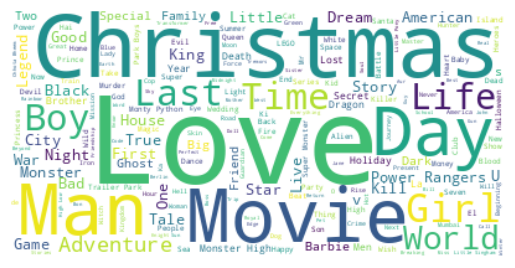

cluster 1


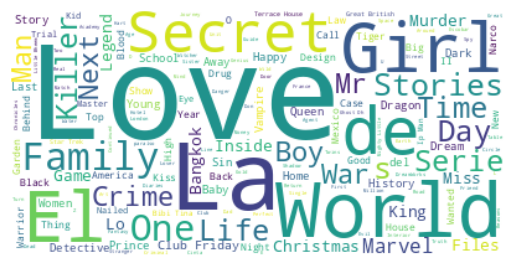

cluster 2


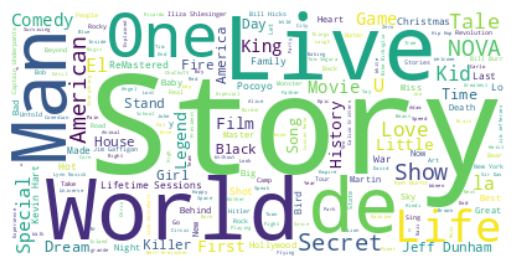

cluster 3


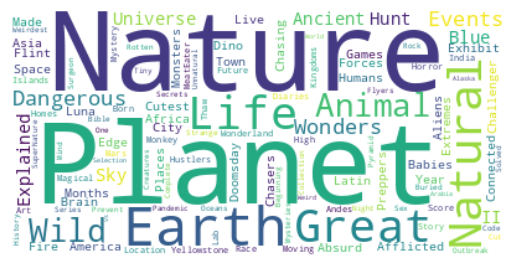

cluster 4


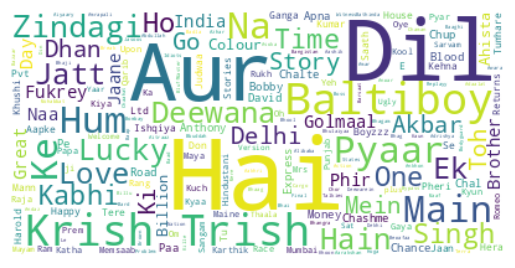

cluster 5


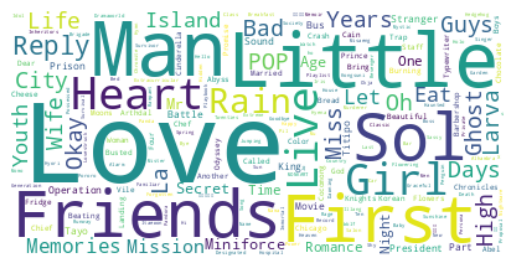

cluster 6


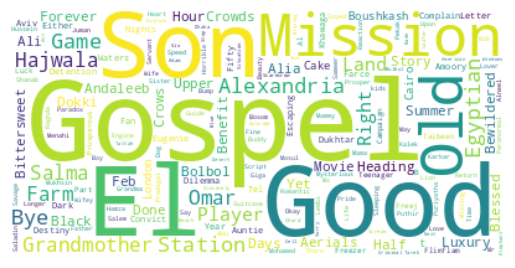

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_wordcloud(i,'title')

***Word Cloud on "description" column for different cluster***

**description**

cluster 0


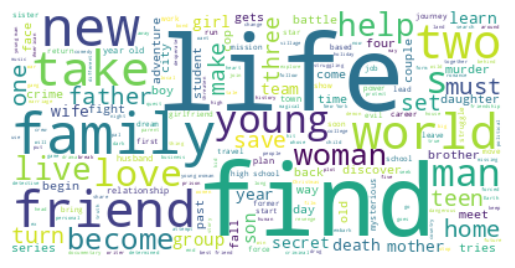

cluster 1


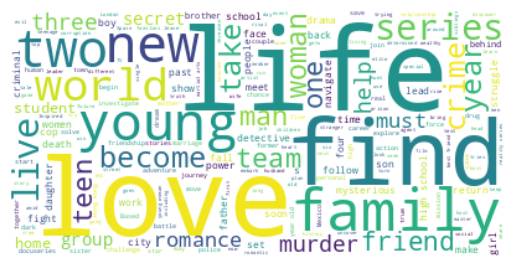

cluster 2


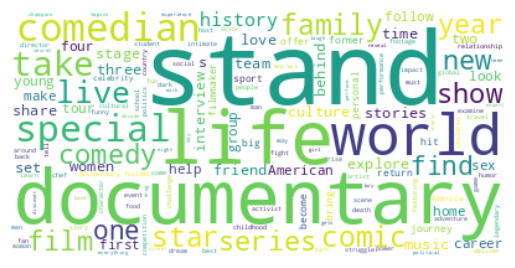

cluster 3


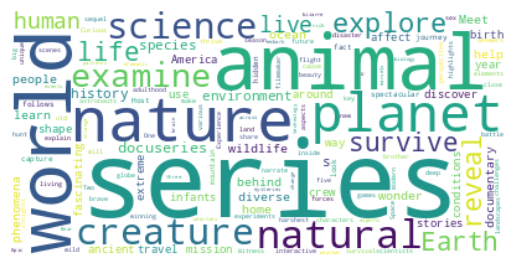

cluster 4


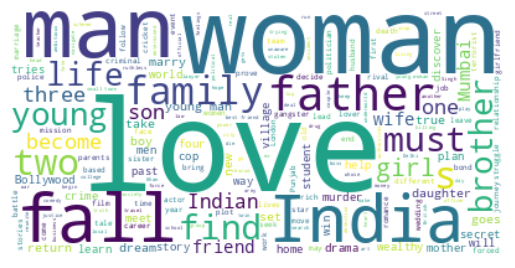

cluster 5


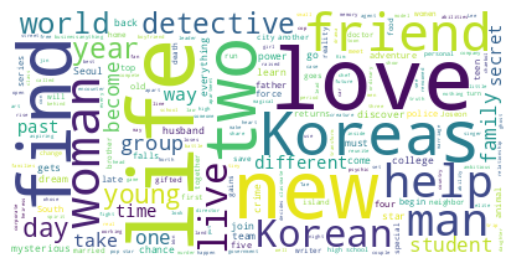

cluster 6


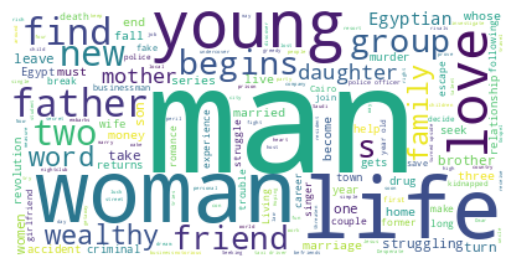

In [ ]:
# description
for i in range(7):
  print(f'cluster {i}')
  hierarchical_wordcloud(i,'description')

***Word Cloud on "cast" column for different cluster***

**cast**

cluster 0


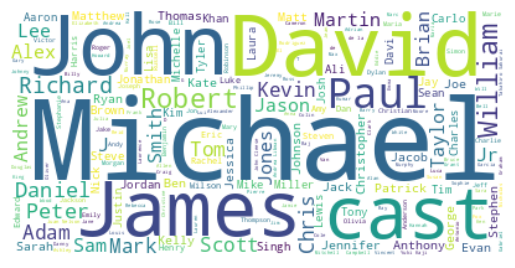

cluster 1


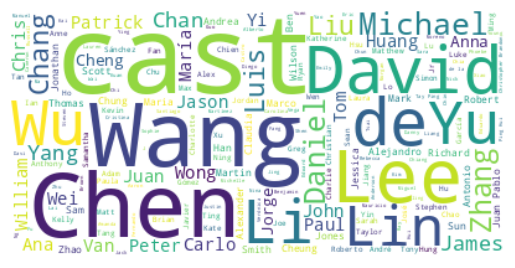

cluster 2


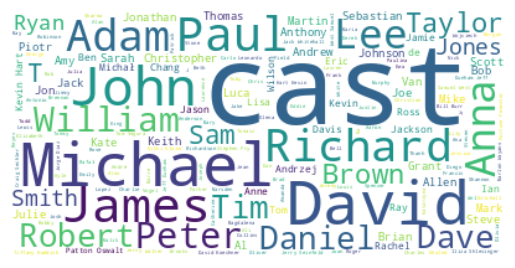

cluster 3


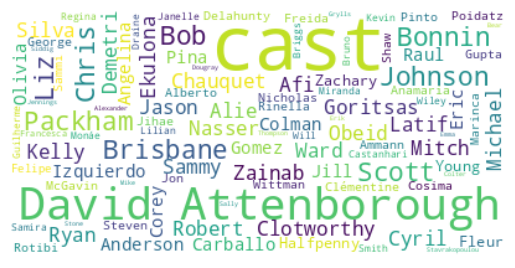

cluster 4


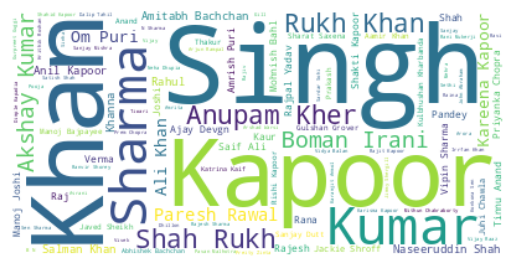

cluster 5


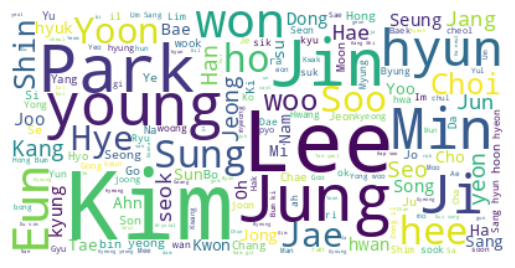

cluster 6


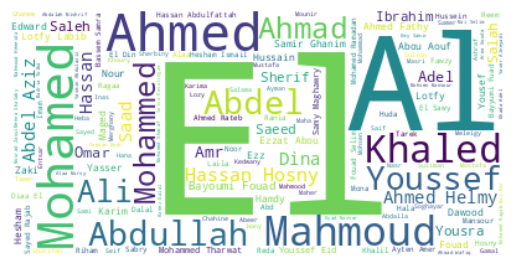

In [ ]:
# cast
for i in range(7):
  print(f'cluster {i}')
  hierarchical_wordcloud(i,'cast')

***Word Cloud on "country" column for different cluster***

**country**

cluster 0


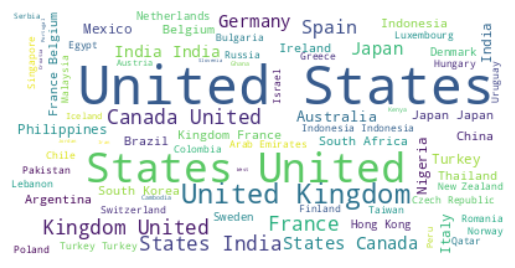

cluster 1


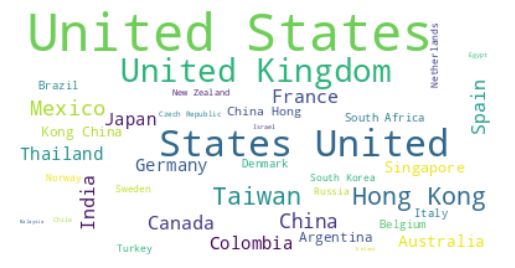

cluster 2


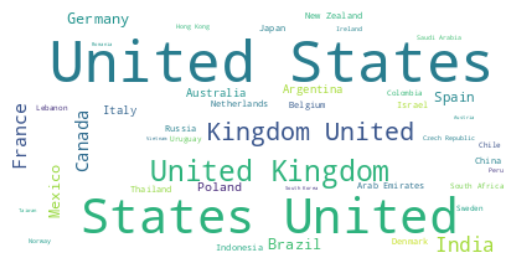

cluster 3


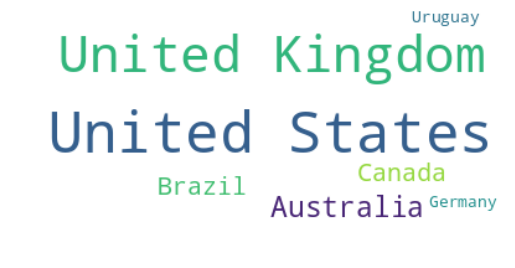

cluster 4


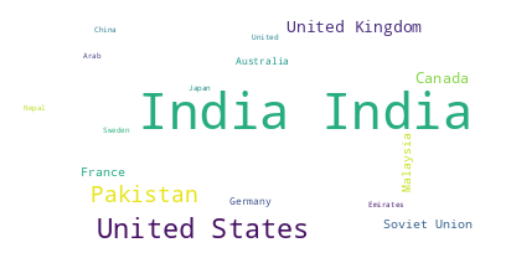

cluster 5


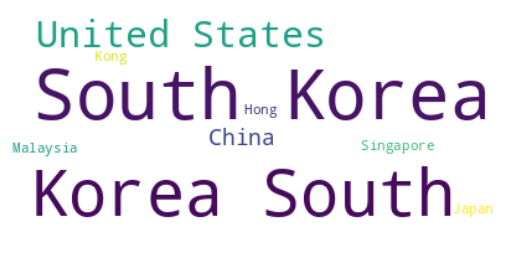

cluster 6


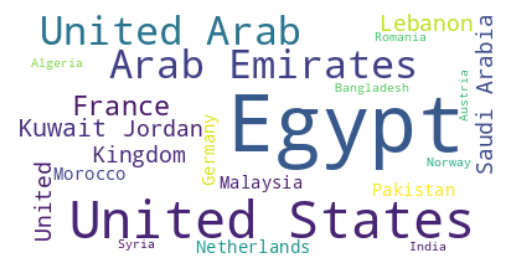

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_wordcloud(i,'country')

***Word Cloud on "listed_in (genre)" column for different cluster***

**listed_in**

cluster 0


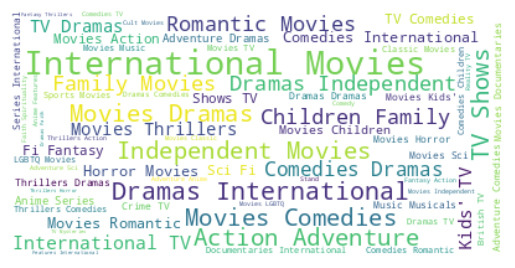

cluster 1


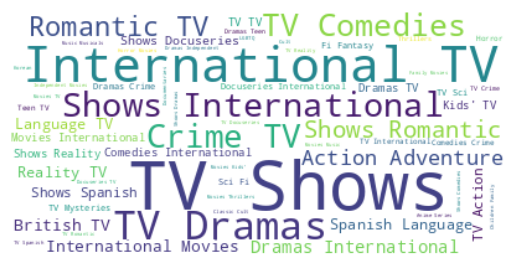

cluster 2


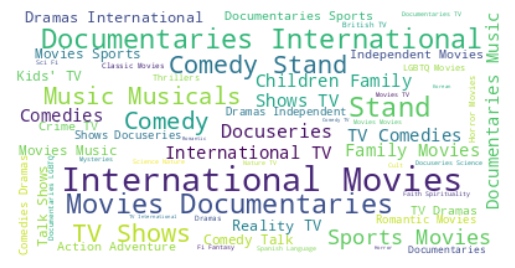

cluster 3


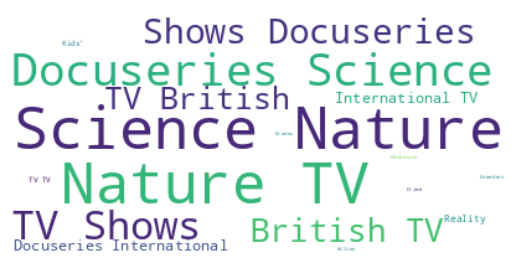

cluster 4


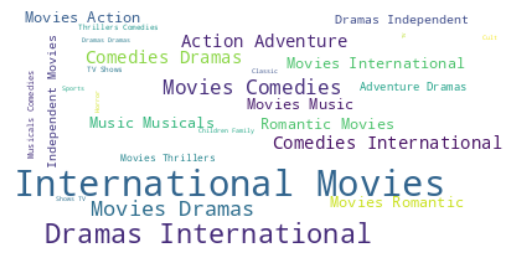

cluster 5


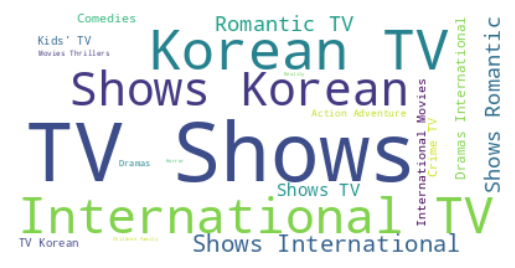

cluster 6


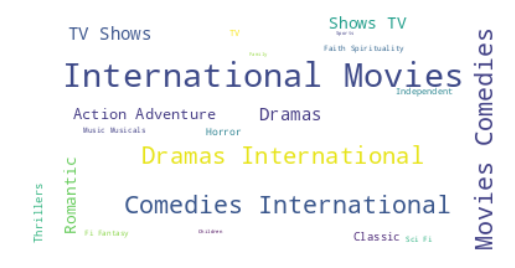

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_wordcloud(i,'listed_in')

**Content Based Recommendation System**

**1.** Content-based recommendation systems suggest items to users based on the similarity of those items. These systems make recommendations by analyzing the description or features of products. The goal is to find items that are similar to the ones the user has shown interest in.

**2.** The content-based recommender system keeps track of the items that a specific user likes. It also considers the preferences and interests of users who share similar behavior and likings. This information is used to recommend items to the user based on their preferences and those of users with similar tastes.

**3.** A simple content-based recommender system can be built by measuring the similarity between movies or shows on Netflix. The system uses techniques like cosine similarity to assess the similarity between the descriptions or features of different shows.

**4.** Cosine similarity is a measure used to calculate the similarity score between two vectors, such as the descriptions of shows. It is obtained by taking the dot product of the two vectors and dividing it by the magnitude of the vectors. A higher cosine similarity score indicates a smaller angle between the vectors and suggests greater similarity between the corresponding shows.

In [ ]:
# Selecting specific columns from the DataFrame 'df'

# Specify the columns to be displayed in the output
selected_columns = ['show_id', 'title', 'tags']

# Create a new DataFrame by selecting the specified columns from 'df'
selected_data = df[selected_columns]

# Display the new DataFrame, showing the 'show_id', 'title', and 'tags' columns
selected_data


,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7782,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7783,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7784,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7785,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


**1.** The DataFrame contains a total of **7770** rows. However, some rows with null values were removed, and the last index displayed in the DataFrame is **7786**.

**2.** To construct a content-based recommendation system, we compute the similarity score based on a specific index_id relative to the corresponding "tags" column.

**3.** Neglecting to reset the index could lead to miscalculating the cosine similarity for a different index, resulting in inaccurate recommendations. Therefore, resetting the index is vital to ensure that the recommendations are based on the correct index.

**4.** Resetting the index involves assigning a new sequential index to each row in the DataFrame, starting from 0. This ensures that each row has a unique and identifiable index, facilitating computations and yielding precise outcomes.

**5.** Consequently, resetting the index plays a pivotal role in developing a content-based recommendation system, guaranteeing that the recommendations are aligned with the correct index, and thus, leading to more accurate and relevant suggestions.

In [ ]:
# Creating a new DataFrame 'recommender_df' for building the recommendation system

# Make a copy of the original DataFrame 'df' to create a new DataFrame 'recommender_df'
recommender_df = df.copy()

# Reset the index of 'recommender_df' to ensure accurate index alignment for the recommendation system
recommender_df.reset_index(inplace=True)

# Display specific columns 'show_id', 'title', and 'tags' of the DataFrame 'recommender_df' to verify the index reset
recommender_df[['show_id', 'title', 'tags']]


,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7765,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7766,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7767,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7768,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


**As demonstrated in the above DataFrame, the index has been successfully reset. The dataset is now prepared for constructing the content-based recommendation system.**

In [ ]:
# Removing 'show_id' and 'index' columns from the DataFrame 'recommender_df'

# Drop the specified columns 'show_id' and 'index' from the DataFrame 'recommender_df'
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
# Setting the index for the DataFrame 'recommender_df'

# Before resetting the index, find the index position of the movie titled 'Zero' in the original DataFrame 'df'
print(f"Before resetting index, the index ID for the movie 'Zero' is: {df[df['title'] == 'Zero'].index[0]}")

# After resetting the index, find the index position of the movie titled 'Zero' in the modified DataFrame 'recommender_df'
print(f"After resetting index, the index ID for the movie 'Zero' is: {recommender_df[recommender_df['title'] == 'Zero'].index[0]}")


Before resetting index, the index ID for the movie 'Zero' is: 7764
After resetting index, the index ID for the movie 'Zero' is: 7747


In [ ]:
# Accessing the transformed array of independent features created from the 'tags' column after performing PCA for dimensionality reduction
X

array([[ 0.16921115, -0.01197205, -0.02823782, ...,  0.00829721,
        -0.00242041, -0.00120945],
       [-0.04473478, -0.00678791,  0.01375052, ..., -0.00489546,
         0.00534488,  0.00139202],
       [-0.04375631, -0.04741594, -0.0290941 , ...,  0.00401624,
         0.00085865, -0.01711205],
       ...,
       [-0.06032754,  0.04138338,  0.09118417, ...,  0.00666849,
         0.00161991, -0.00864044],
       [ 0.06879288,  0.04511482,  0.01732747, ..., -0.01168713,
         0.01103111, -0.00563083],
       [-0.06770369,  0.15601595,  0.10344612, ..., -0.00292853,
        -0.00469807, -0.00662313]])

In [ ]:
# Calculate cosine similarity for the transformed feature array 'X'
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.08899069,  0.02244524, ..., -0.02520894,
         0.01088463, -0.02037508],
       [ 0.08899069,  1.        , -0.00478673, ...,  0.07069377,
        -0.009625  , -0.00780089],
       [ 0.02244524, -0.00478673,  1.        , ..., -0.0015235 ,
        -0.01074518, -0.01269644],
       ...,
       [-0.02520894,  0.07069377, -0.0015235 , ...,  1.        ,
        -0.01697953,  0.05312126],
       [ 0.01088463, -0.009625  , -0.01074518, ..., -0.01697953,
         1.        ,  0.04270387],
       [-0.02037508, -0.00780089, -0.01269644, ...,  0.05312126,
         0.04270387,  1.        ]])

**Function to list down top 10 recommended movies on the basis of cosine similarity score**

In [ ]:
# Function to recommend top ten movies based on similarity score for a given movie

def recommend(movie):
    '''
    This function recommends the top ten movies similar to the given movie based on similarity scores.

    Parameters:
        movie (str): The title of the movie for which recommendations are to be made.

    Returns:
        None (Prints the recommended movie titles)
    '''

    # Display the message indicating the input movie
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # Find the index position of the input movie in the DataFrame 'recommender_df'
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # Sort the similarity scores in descending order, to identify movies with the highest similarity to the input movie
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x: x[1])

    # Display the top ten recommended movies, excluding the input movie itself
    for i in distances[1:11]:
        print(df.iloc[i[0]].title)


In [ ]:
# Recommendation for the movie Naruto
recommend('Naruto')

If you liked 'Naruto', you may also enjoy: 

Naruto Shippûden the Movie: Bonds
Naruto Shippuden: The Movie
Naruto Shippuden : Blood Prison
Naruto the Movie 2: Legend of the Stone of Gelel
Naruto Shippûden the Movie: The Will of Fire
Naruto the Movie 3: Guardians of the Crescent Moon Kingdom
Naruto Shippuden: The Movie: The Lost Tower
Dino Girl Gauko
DRIFTING DRAGONS
Transformers: War for Cybertron: Earthrise


In [ ]:
# Recommendation for the movie Our Planet
recommend('Our Planet')

If you liked 'Our Planet', you may also enjoy: 

Nature's Great Events: Diaries
Nature's Great Events (2009)
Nature's Weirdest Events
Blue Planet II
Planet Earth II
Life Story
Night on Earth
The Making of Frozen Planet
The Hunt
Moving Art


In [ ]:
# Recommendation for the movie Phir Hera Pheri
recommend('Phir Hera Pheri')

If you liked 'Phir Hera Pheri', you may also enjoy: 

Bhool Bhulaiyaa
Thank You
Golmaal: Fun Unlimited
Bhagam Bhag
Chup Chup Ke
Ready
Khushi
Life in a ... Metro
Hasee Toh Phasee
Hattrick


### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**Thank You! for being a part of this thrilling journey of exploring the captivating realm of Netflix shows! Our aim was to group the shows into clusters based on their similarities and differences, ultimately crafting a content-based recommender system that suggests 10 shows based on users' viewing history.**

**1.** With a dataset comprising more than **7787** records and **11** attributes, we embarked on our adventure by examining missing values and conducting exploratory data analysis (EDA). Our discoveries revealed that Netflix boasts a larger collection of movies than TV shows, with a burgeoning array of shows hailing from the United States.

**2.** To cluster the shows effectively, we focused on six crucial attributes: director, cast, country, genre, rating, and description. These attributes were transformed into a **10000-feature** TFIDF vectorization, and Principal Component Analysis (PCA) was employed to address the challenges of high dimensionality. By reducing the components to **3000**, we successfully captured over **80%** of the variance.

**3.** Next, we employed two clustering algorithms, K-Means and Agglomerative clustering, to group the shows. K-Means indicated that **5** clusters were optimal, a finding confirmed by the elbow method and Silhouette score analysis. Meanwhile, Agglomerative clustering suggested **7** clusters, which we visualized using a dendrogram.

**4.** However, our journey didn't end there. We took it a step further by creating a **content-based recommender system** using the similarity matrix obtained through **cosine similarity**. This remarkable system provides personalized recommendations based on users' previous show selections, presenting them with 10 exceptional suggestions to explore.

**I invite you to join me in unraveling the diverse world of Netflix shows, as my recommender system guides you towards your next captivating binge-worthy fascination.**

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***